## Task 1 : Ascending the Gradient Descent [6 marks]

Use the below dataset for Task 1:
```py
np.random.seed(45)
num_samples = 40
    
# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3*x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps
```

1. Use ```torch.autograd``` to find the true gradient on the above dataset using linear regression (in the form $\theta_1x + \theta_0$) for any given values of $(\theta_0,\theta_1)$. **[1 mark]**

2. Using the same $(\theta_0,\theta_1)$ as above, calculate the stochastic gradient for all points in the dataset. Then, find the average of all those gradients and show that the stochastic gradient is a good estimate of the true gradient.  **[1 mark]**

3. Implement full-batch, mini-batch and stochastic gradient descent. Calculate the average number of iterations required for each method to get sufficiently close to the optimal solution, where "sufficiently close" means within a distance of $\epsilon$ (or $\epsilon$-neighborhood)  from the minimum value of the loss function. Visualize the convergence process for 15 epochs. Choose $\epsilon = 0.001$ for convergence criteria. Which optimization process takes a larger number of epochs to converge, and why? Show the contour plots for different epochs (or show an animation/GIF) for visualisation of optimisation process. Also, make a plot for Loss v/s epochs for all the methods. **[2 marks]**

4. Explore the article [here](https://machinelearningmastery.com/gradient-descent-with-momentum-from-scratch/#:~:text=Momentum%20is%20an%20extension%20to,spots%20of%20the%20search%20space.) on gradient descent with momentum. Implement gradient descent with momentum for the dataset. Visualize the convergence process for 15 steps. Compare the average number of steps taken with gradient descent (for variants full batch and stochastic) with momentum to that of vanilla gradient descent to converge to an $\epsilon$-neighborhood for both dataset. Choose $\epsilon = 0.001$. Write down your observations. Show the contour plots for different epochs for momentum implementation. Specifically, show all the vectors: gradient, current value of theta, momentum, etc. **[2 marks]**


In [ ]:
import numpy as np
import torch

# Seed for reproducibility
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3 * x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps

# Convert data to PyTorch tensors
x = torch.from_numpy(x1.reshape(-1, 1)).float()
y = torch.from_numpy(y.reshape(-1, 1)).float()

# 1. True gradient calculation
def true_gradient(theta0, theta1):
    theta0 = torch.tensor(theta0, requires_grad=True)
    theta1 = torch.tensor(theta1, requires_grad=True)
    y_pred = theta0 + theta1 * x
    loss = torch.mean((y_pred - y) ** 2)
    grads = torch.autograd.grad(loss, [theta0, theta1])
    return [g.item() for g in grads]

# 2. Stochastic gradient calculation
def stochastic_gradient(theta0, theta1):
    theta = torch.tensor([theta0, theta1], requires_grad=True)
    gradients = []

    for i in range(num_samples):
        theta.requires_grad_(True)  # Ensure gradients are computed for theta
        y_pred = theta[0] + theta[1] * x[i]
        loss = (y_pred - y[i]) ** 2
        loss.backward()
        gradients.append(theta.grad.detach().numpy().copy())  # Copy gradients to prevent overwriting
        theta.grad.zero_()  # Reset gradients to avoid accumulation

    return np.mean(gradients, axis=0)

# Test the functions for θ₀ = 1 and θ₁ = 2
true_grad = true_gradient(1.0, 2.0)
stoch_grad = stochastic_gradient(1.0, 2.0)

print("True Gradient:", true_grad)
print("Stochastic Gradient:", stoch_grad)
print("Difference:", true_grad - stoch_grad)


True Gradient: [-5.785815715789795, 0.06868770718574524]
Stochastic Gradient: [-5.785816    0.06868766]
Difference: [4.76837158e-07 4.47034836e-08]


1.3

In [ ]:
import numpy as np
!pip install torch
import matplotlib.pyplot as plt

Below code is running normally at max for 1000 epoches and trying to get epsilon <= 0.001.

Full-Batch Gradient Descent converged in 999 epoch and min loss is 0.5957686305046082 .
Mini-Batch Gradient Descent converged in 245 epoch and min loss is 0.5966351091861725 .
Stochastic Gradient Descent converged in 23 epoch min loss is 0.6109818145916506 .


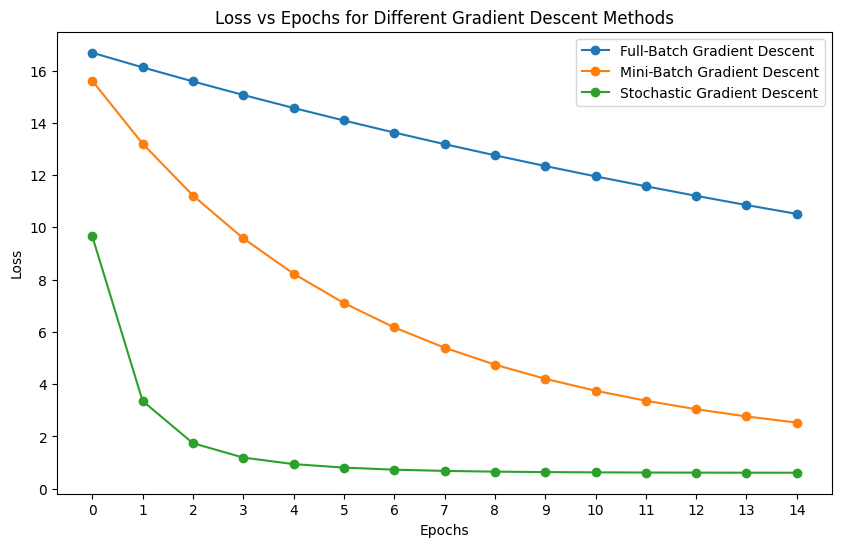

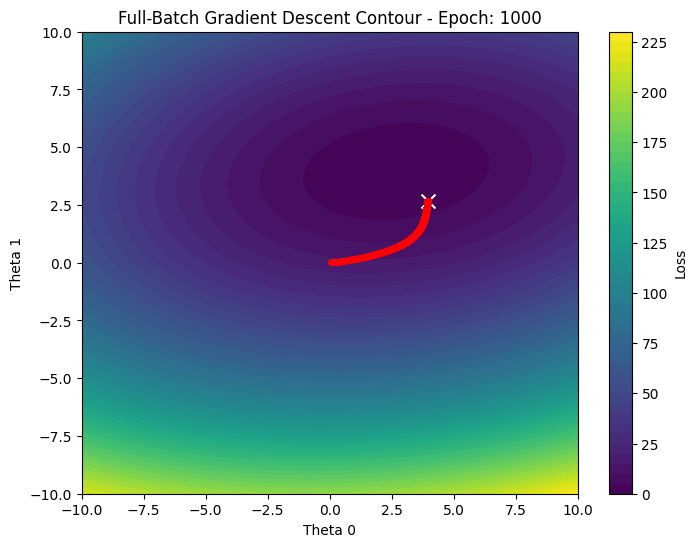

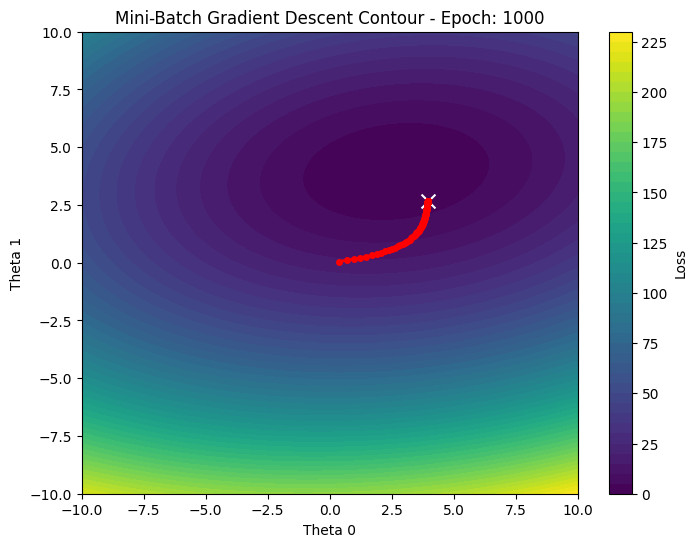

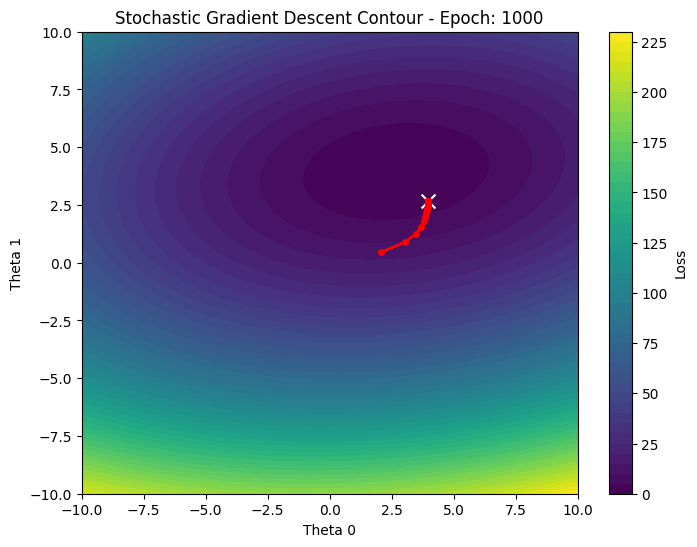

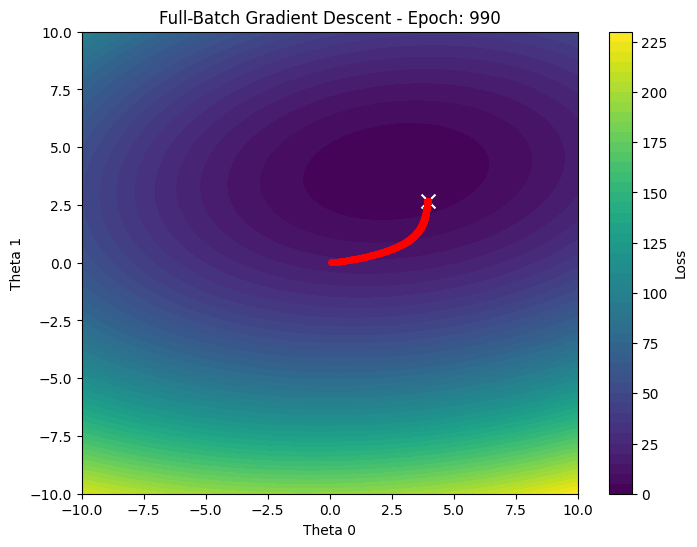

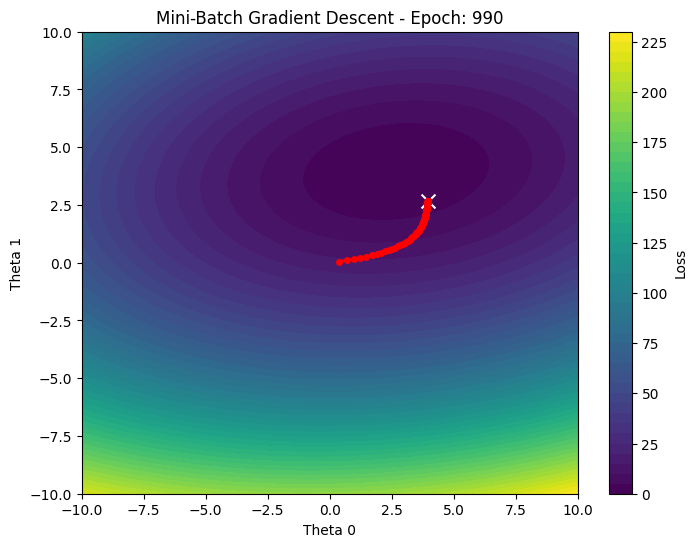

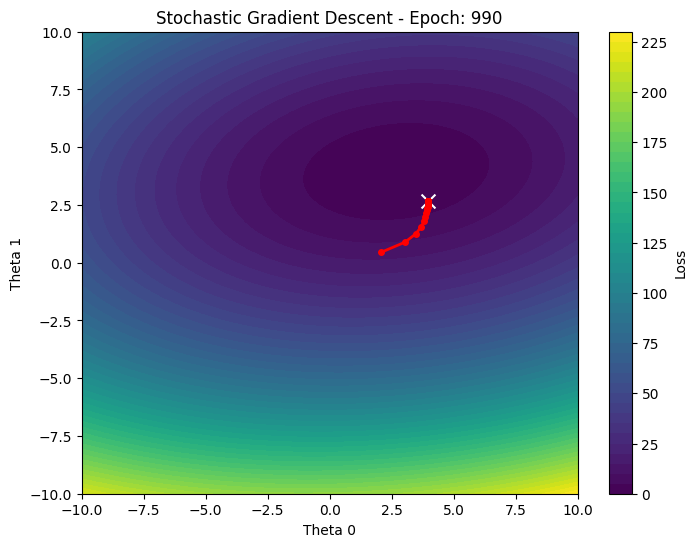

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Data Preparation
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3 * x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps

# Convert to torch tensors
x1_tensor = torch.tensor(x1, dtype=torch.float32).view(-1, 1)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# Define a function to compute the loss
def compute_loss(theta_0, theta_1, x, y):
    y_pred = theta_0 + theta_1 * x
    loss = ((y_pred - y) ** 2).mean()
    return loss

# Gradient Descent Implementations with Trajectory
def gradient_descent_with_trajectory(x, y, lr, max_epochs, epsilon, method='full-batch', batch_size=None):
    theta_0 = torch.tensor(0.0, requires_grad=True)
    theta_1 = torch.tensor(0.0, requires_grad=True)
    optimizer = torch.optim.SGD([theta_0, theta_1], lr=lr)
    losses = []
    trajectory = []
    iterations = 0

    for epoch in range(max_epochs):
        epoch_loss = 0
        if method == 'full-batch':
            y_pred = theta_0 + theta_1 * x
            loss = ((y_pred - y) ** 2).mean()
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            epoch_loss = loss.item()
        elif method == 'mini-batch':
            for i in range(0, len(x), batch_size):
                x_batch = x[i:i+batch_size]
                y_batch = y[i:i+batch_size]
                y_pred = theta_0 + theta_1 * x_batch
                loss = ((y_pred - y_batch) ** 2).mean()
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()
            epoch_loss /= (len(x) // batch_size)
        elif method == 'stochastic':
            for i in range(len(x)):
                y_pred = theta_0 + theta_1 * x[i]
                loss = ((y_pred - y[i]) ** 2).mean()
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()
            epoch_loss /= len(x)

        losses.append(epoch_loss)
        trajectory.append((theta_0.item(), theta_1.item()))
        iterations += 1

        if epoch_loss <= epsilon:
            break

    return theta_0, theta_1, losses, iterations, trajectory

# Hyperparameters
learning_rate = 0.01
max_epochs = 1000
epsilon = 0.001
batch_size = 8

# Full-Batch Gradient Descent
_, _, losses_full, iterations_full, trajectory_full = gradient_descent_with_trajectory(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='full-batch')

# Mini-Batch Gradient Descent
_, _, losses_mini, iterations_mini, trajectory_mini = gradient_descent_with_trajectory(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='mini-batch', batch_size=batch_size)

# Stochastic Gradient Descent
_, _, losses_stochastic, iterations_stochastic, trajectory_stochastic = gradient_descent_with_trajectory(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='stochastic')

# Calculate Average Iterations
print(f"Full-Batch Gradient Descent converged in {losses_full.index(min(losses_full))} epoch and min loss is {min(losses_full)} .")
print(f"Mini-Batch Gradient Descent converged in {losses_mini.index(min(losses_mini))} epoch and min loss is {min(losses_mini)} .")
print(f"Stochastic Gradient Descent converged in {losses_stochastic.index(min(losses_stochastic))} epoch min loss is {min(losses_stochastic)} .")

# Plot Loss vs Epochs
plt.figure(figsize=(10, 6))
plt.plot(losses_full[0:15], label='Full-Batch Gradient Descent', marker='o')
plt.plot(losses_mini[0:15], label='Mini-Batch Gradient Descent', marker='o')
plt.plot(losses_stochastic[0:15], label='Stochastic Gradient Descent', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Epochs for Different Gradient Descent Methods')
plt.xticks(range(15))
plt.legend()
plt.show()

# Contour Plot with Trajectory
def plot_contour_with_trajectory(x, y, trajectory, title, epoch):
    theta_0_vals = np.linspace(-10, 10, 100)
    theta_1_vals = np.linspace(-10, 10, 100)
    loss_vals = np.zeros((len(theta_0_vals), len(theta_1_vals)))

    for i in range(len(theta_0_vals)):
        for j in range(len(theta_1_vals)):
            theta_0 = torch.tensor(theta_0_vals[i], requires_grad=False)
            theta_1 = torch.tensor(theta_1_vals[j], requires_grad=False)
            loss_vals[i, j] = compute_loss(theta_0, theta_1, x, y).item()

    fig, ax = plt.subplots(figsize=(8, 6))
    contour = ax.contourf(theta_0_vals, theta_1_vals, loss_vals, levels=50, cmap='viridis')
    cbar = fig.colorbar(contour)
    cbar.ax.set_ylabel('Loss')
    ax.set_title(f'{title} - Epoch: {epoch}')
    ax.set_xlabel('Theta 0')
    ax.set_ylabel('Theta 1')

    trajectory = np.array(trajectory)
    ax.plot(trajectory[:, 0], trajectory[:, 1], marker='o', color='red', linestyle='-', linewidth=2, markersize=4)
    ax.scatter(trajectory[-1, 0], trajectory[-1, 1], marker='x', color='white', s=100)
    plt.show()

# Plot contour plots for different epochs
plot_contour_with_trajectory(x1_tensor, y_tensor, trajectory_full, "Full-Batch Gradient Descent Contour", epoch=len(losses_full))
plot_contour_with_trajectory(x1_tensor, y_tensor, trajectory_mini, "Mini-Batch Gradient Descent Contour", epoch=len(losses_mini))
plot_contour_with_trajectory(x1_tensor, y_tensor, trajectory_stochastic, "Stochastic Gradient Descent Contour", epoch=len(losses_stochastic))

# Create an animation of the optimization process
def create_animation(x, y, trajectories, titles, filename):
    fig, ax = plt.subplots(figsize=(8, 6))
    theta_0_vals = np.linspace(-10, 10, 100)
    theta_1_vals = np.linspace(-10, 10, 100)
    loss_vals = np.zeros((len(theta_0_vals), len(theta_1_vals)))

    for i in range(len(theta_0_vals)):
        for j in range(len(theta_1_vals)):
            theta_0 = torch.tensor(theta_0_vals[i], requires_grad=False)
            theta_1 = torch.tensor(theta_1_vals[j], requires_grad=False)
            loss_vals[i, j] = compute_loss(theta_0, theta_1, x, y).item()

    contour = ax.contourf(theta_0_vals, theta_1_vals, loss_vals, levels=50, cmap='viridis')
    cbar = fig.colorbar(contour)
    cbar.ax.set_ylabel('Loss')

    def update(frame):
        ax.clear()
        ax.contourf(theta_0_vals, theta_1_vals, loss_vals, levels=50, cmap='viridis')
        ax.set_title(f'{titles[0]} - Epoch: {frame}')
        ax.set_xlabel('Theta 0')
        ax.set_ylabel('Theta 1')

        trajectory = np.array(trajectories[0])
        ax.plot(trajectory[:frame, 0], trajectory[:frame, 1], marker='o', color='red', linestyle='-', linewidth=2, markersize=4)
        ax.scatter(trajectory[min(frame, len(trajectory)-1), 0], trajectory[min(frame, len(trajectory)-1), 1], marker='x', color='white', s=100)
        return ax

    ani = FuncAnimation(fig, update, frames=range(0, max(len(losses_full), len(losses_mini), len(losses_stochastic)), 10), repeat=False)
    ani.save(filename, writer='pillow')

# Create animations for each method
create_animation(x1_tensor, y_tensor, [trajectory_full], ["Full-Batch Gradient Descent"], filename='full_batch_optimization.gif')
create_animation(x1_tensor, y_tensor, [trajectory_mini], ["Mini-Batch Gradient Descent"], filename='mini_batch_optimization.gif')
create_animation(x1_tensor, y_tensor, [trajectory_stochastic], ["Stochastic Gradient Descent"], filename='stochastic_optimization.gif')

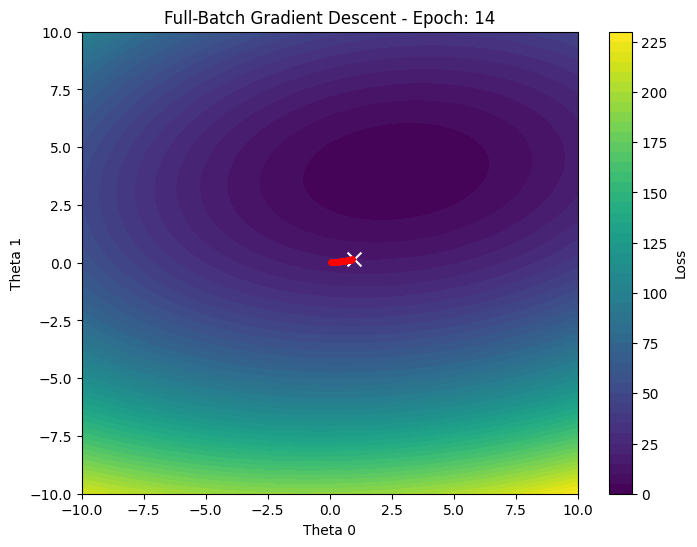

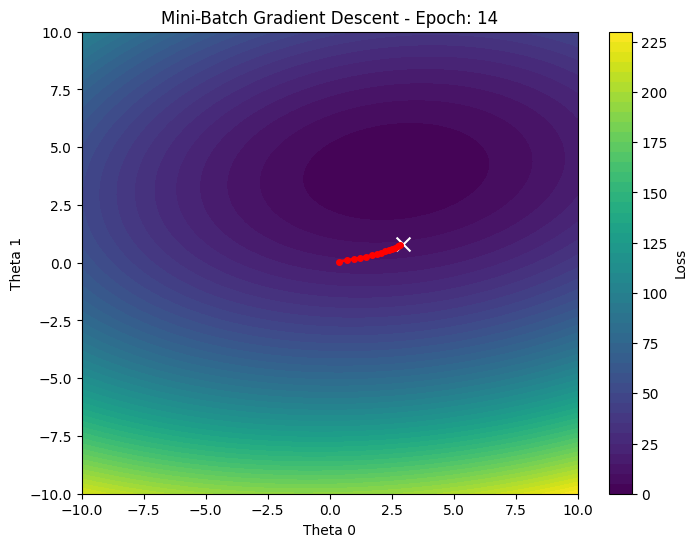

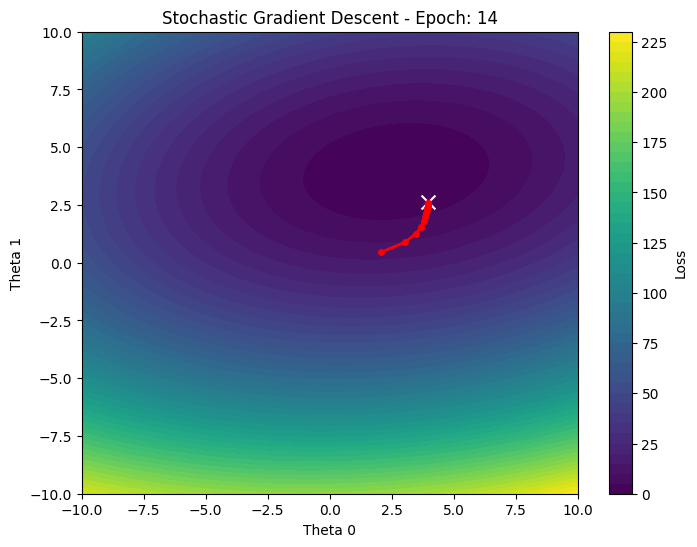

In [ ]:
def create_animation(x, y, trajectories, titles, filename):
    fig, ax = plt.subplots(figsize=(8, 6))
    theta_0_vals = np.linspace(-10, 10, 100)
    theta_1_vals = np.linspace(-10, 10, 100)
    loss_vals = np.zeros((len(theta_0_vals), len(theta_1_vals)))

    for i in range(len(theta_0_vals)):
        for j in range(len(theta_1_vals)):
            theta_0 = torch.tensor(theta_0_vals[i], requires_grad=False)
            theta_1 = torch.tensor(theta_1_vals[j], requires_grad=False)
            loss_vals[i, j] = compute_loss(theta_0, theta_1, x, y).item()

    contour = ax.contourf(theta_0_vals, theta_1_vals, loss_vals, levels=50, cmap='viridis')
    cbar = fig.colorbar(contour)
    cbar.ax.set_ylabel('Loss')

    def update(frame):
        ax.clear()
        ax.contourf(theta_0_vals, theta_1_vals, loss_vals, levels=50, cmap='viridis')
        ax.set_title(f'{titles[0]} - Epoch: {frame}')
        ax.set_xlabel('Theta 0')
        ax.set_ylabel('Theta 1')

        trajectory = np.array(trajectories[0])
        ax.plot(trajectory[:frame, 0], trajectory[:frame, 1], marker='o', color='red', linestyle='-', linewidth=2, markersize=4)
        ax.scatter(trajectory[min(frame, len(trajectory)-1), 0], trajectory[min(frame, len(trajectory)-1), 1], marker='x', color='white', s=100)
        return ax

    ani = FuncAnimation(fig, update, frames=range(0, 15), interval=500, repeat=False)  # Only 15 epochs and slow down animation (interval=500)
    ani.save(filename, writer='pillow')

# Create animations for each method (limited to 15 epochs)
create_animation(x1_tensor, y_tensor, [trajectory_full], ["Full-Batch Gradient Descent"], filename='full_batch_optimization_1.gif')
create_animation(x1_tensor, y_tensor, [trajectory_mini], ["Mini-Batch Gradient Descent"], filename='mini_batch_optimization_1.gif')
create_animation(x1_tensor, y_tensor, [trajectory_stochastic], ["Stochastic Gradient Descent"], filename='stochastic_optimization_1.gif')

Below code is using convergence.Where break loop if current loss - previous loss <= 0.001

Full-Batch Gradient Descent converged in 296 epoch and min loss is 0.6758800745010376 .
Mini-Batch Gradient Descent converged in 86 epoch and min loss is 0.611470741033554 .
Stochastic Gradient Descent converged in 15 epoch min loss is 0.612010331748752 .


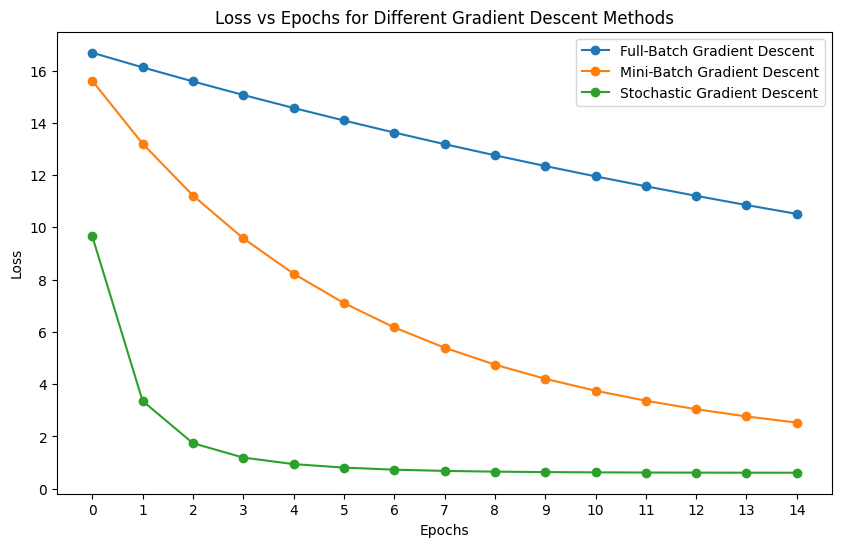

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Data Preparation
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3 * x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps

# Convert to torch tensors
x1_tensor = torch.tensor(x1, dtype=torch.float32).view(-1, 1)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# Define a function to compute the loss
def compute_loss(theta_0, theta_1, x, y):
    y_pred = theta_0 + theta_1 * x
    loss = ((y_pred - y) ** 2).mean()
    return loss

# Gradient Descent Implementations with Trajectory (without optimizer)
def gradient_descent_with_trajectory(x, y, lr, max_epochs, epsilon, method='full-batch', batch_size=None, initial_theta_0=None, initial_theta_1=None):
    theta_0 = torch.tensor(initial_theta_0 if initial_theta_0 is not None else 0.0, requires_grad=True)
    theta_1 = torch.tensor(initial_theta_1 if initial_theta_1 is not None else 0.0, requires_grad=True)
    losses = []
    trajectory = []
    iterations = 0
    previous_loss = None

    for epoch in range(max_epochs):
        epoch_loss = 0

        if method == 'full-batch':
            y_pred = theta_0 + theta_1 * x
            loss = ((y_pred - y) ** 2).mean()
            loss.backward()

            with torch.no_grad():
                theta_0 -= lr * theta_0.grad
                theta_1 -= lr * theta_1.grad
                theta_0.grad.zero_()
                theta_1.grad.zero_()

            epoch_loss = loss.item()

        elif method == 'mini-batch':
            for i in range(0, len(x), batch_size):
                x_batch = x[i:i+batch_size]
                y_batch = y[i:i+batch_size]
                y_pred = theta_0 + theta_1 * x_batch
                loss = ((y_pred - y_batch) ** 2).mean()
                loss.backward()

                with torch.no_grad():
                    theta_0 -= lr * theta_0.grad
                    theta_1 -= lr * theta_1.grad
                    theta_0.grad.zero_()
                    theta_1.grad.zero_()

                epoch_loss += loss.item()
            epoch_loss /= (len(x) // batch_size)

        elif method == 'stochastic':
            for i in range(len(x)):
                y_pred = theta_0 + theta_1 * x[i]
                loss = ((y_pred - y[i]) ** 2).mean()
                loss.backward()

                with torch.no_grad():
                    theta_0 -= lr * theta_0.grad
                    theta_1 -= lr * theta_1.grad
                    theta_0.grad.zero_()
                    theta_1.grad.zero_()

                epoch_loss += loss.item()
            epoch_loss /= len(x)

        losses.append(epoch_loss)
        trajectory.append((theta_0.item(), theta_1.item()))
        iterations += 1

        if previous_loss is not None and abs(epoch_loss - previous_loss) <= epsilon:
            break

        # Update previous_loss for the next epoch
        previous_loss = epoch_loss

    return theta_0, theta_1, losses, iterations, trajectory

# Hyperparameters
learning_rate = 0.01
max_epochs = 1000
epsilon = 0.001
batch_size = 8

# Full-Batch Gradient Descent
_, _, losses_full, iterations_full, trajectory_full = gradient_descent_with_trajectory(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='full-batch')

# Mini-Batch Gradient Descent
_, _, losses_mini, iterations_mini, trajectory_mini = gradient_descent_with_trajectory(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='mini-batch', batch_size=batch_size)

# Stochastic Gradient Descent
_, _, losses_stochastic, iterations_stochastic, trajectory_stochastic = gradient_descent_with_trajectory(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='stochastic')

# Calculate Average Iterations
print(f"Full-Batch Gradient Descent converged in {losses_full.index(min(losses_full))} epoch and min loss is {min(losses_full)} .")
print(f"Mini-Batch Gradient Descent converged in {losses_mini.index(min(losses_mini))} epoch and min loss is {min(losses_mini)} .")
print(f"Stochastic Gradient Descent converged in {losses_stochastic.index(min(losses_stochastic))} epoch min loss is {min(losses_stochastic)} .")

# Plot Loss vs Epochs
plt.figure(figsize=(10, 6))
plt.plot(losses_full[0:15], label='Full-Batch Gradient Descent', marker='o')
plt.plot(losses_mini[0:15], label='Mini-Batch Gradient Descent', marker='o')
plt.plot(losses_stochastic[0:15], label='Stochastic Gradient Descent', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Epochs for Different Gradient Descent Methods')
plt.xticks(range(15))
plt.legend()
plt.show()

Below is the code for finding avg number of epoch for convergence for all variations.

Full-Batch Gradient Descent converged in an average of 302 epochs.
Mini-Batch Gradient Descent converged in an average of 88 epochs.
Stochastic Gradient Descent converged in an average of 16 epochs.


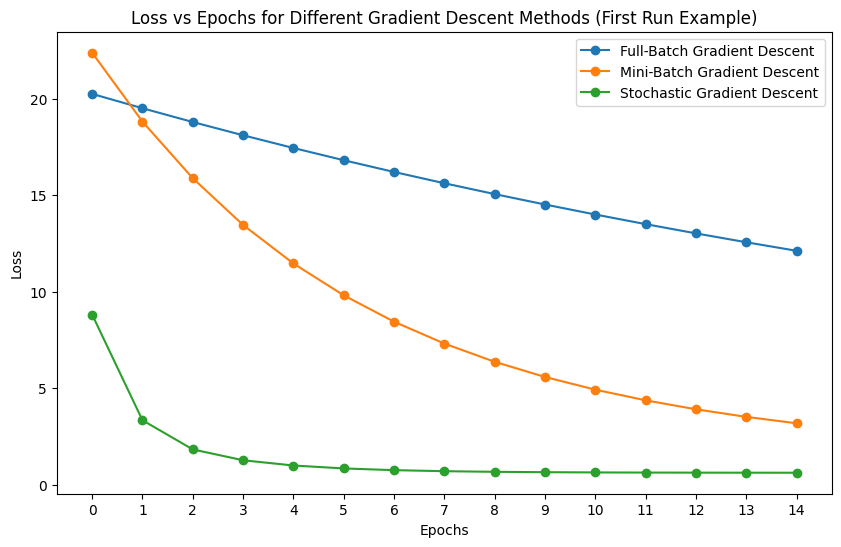

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Data Preparation
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3 * x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps

# Convert to torch tensors
x1_tensor = torch.tensor(x1, dtype=torch.float32).view(-1, 1)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# Define a function to compute the loss
def compute_loss(theta_0, theta_1, x, y):
    y_pred = theta_0 + theta_1 * x
    loss = ((y_pred - y) ** 2).mean()
    return loss

# Gradient Descent Implementation with Trajectory (without optimizer)
def gradient_descent_with_trajectory(x, y, lr, max_epochs, epsilon, method='full-batch', batch_size=None, initial_theta_0=None, initial_theta_1=None):
    # Initialize theta_0 and theta_1 based on provided values or start from 0.0
    theta_0 = torch.tensor(initial_theta_0 if initial_theta_0 is not None else 0.0, requires_grad=True)
    theta_1 = torch.tensor(initial_theta_1 if initial_theta_1 is not None else 0.0, requires_grad=True)

    losses = []
    trajectory = []
    iterations = 0
    previous_loss = None

    for epoch in range(max_epochs):
        epoch_loss = 0

        if method == 'full-batch':
            y_pred = theta_0 + theta_1 * x
            loss = ((y_pred - y) ** 2).mean()
            loss.backward()

            with torch.no_grad():
                theta_0 -= lr * theta_0.grad
                theta_1 -= lr * theta_1.grad
                theta_0.grad.zero_()
                theta_1.grad.zero_()

            epoch_loss = loss.item()

        elif method == 'mini-batch':
            for i in range(0, len(x), batch_size):
                x_batch = x[i:i+batch_size]
                y_batch = y[i:i+batch_size]
                y_pred = theta_0 + theta_1 * x_batch
                loss = ((y_pred - y_batch) ** 2).mean()
                loss.backward()

                with torch.no_grad():
                    theta_0 -= lr * theta_0.grad
                    theta_1 -= lr * theta_1.grad
                    theta_0.grad.zero_()
                    theta_1.grad.zero_()

                epoch_loss += loss.item()
            epoch_loss /= (len(x) // batch_size)

        elif method == 'stochastic':
            for i in range(len(x)):
                y_pred = theta_0 + theta_1 * x[i]
                loss = ((y_pred - y[i]) ** 2).mean()
                loss.backward()

                with torch.no_grad():
                    theta_0 -= lr * theta_0.grad
                    theta_1 -= lr * theta_1.grad
                    theta_0.grad.zero_()
                    theta_1.grad.zero_()

                epoch_loss += loss.item()
            epoch_loss /= len(x)

        losses.append(epoch_loss)
        trajectory.append((theta_0.item(), theta_1.item()))
        iterations += 1

        if previous_loss is not None and abs(epoch_loss - previous_loss) <= epsilon:
            break

        # Update previous_loss for the next epoch
        previous_loss = epoch_loss

    return theta_0, theta_1, losses, iterations, trajectory

# Run gradient descent with 10 different initial values for theta_0 and theta_1
def run_experiments(x, y, lr, max_epochs, epsilon, method, batch_size=None):
    total_iterations = 0
    num_runs = 10
    avg_losses = []
    avg_trajectory = []

    for run in range(num_runs):
        initial_theta_0 = np.random.uniform(-1, 1)
        initial_theta_1 = np.random.uniform(-1, 1)

        _, _, losses, iterations, trajectory = gradient_descent_with_trajectory(
            x, y, lr, max_epochs, epsilon, method=method, batch_size=batch_size,
            initial_theta_0=initial_theta_0, initial_theta_1=initial_theta_1
        )

        total_iterations += iterations
        avg_losses.append(losses)
        avg_trajectory.append(trajectory)

    # Calculate the average number of iterations
    avg_iterations = total_iterations / num_runs
    return avg_iterations, avg_losses, avg_trajectory

# Hyperparameters
learning_rate = 0.01
max_epochs = 1000
epsilon = 0.001
batch_size = 8

# Full-Batch Gradient Descent
avg_iterations_full, avg_losses_full, avg_trajectory_full = run_experiments(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='full-batch')

# Mini-Batch Gradient Descent
avg_iterations_mini, avg_losses_mini, avg_trajectory_mini = run_experiments(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='mini-batch', batch_size=batch_size)

# Stochastic Gradient Descent
avg_iterations_stochastic, avg_losses_stochastic, avg_trajectory_stochastic = run_experiments(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, method='stochastic')

# Output average results
print(f"Full-Batch Gradient Descent converged in an average of {avg_iterations_full:.0f} epochs.")
print(f"Mini-Batch Gradient Descent converged in an average of {avg_iterations_mini:.0f} epochs.")
print(f"Stochastic Gradient Descent converged in an average of {avg_iterations_stochastic:.0f} epochs.")

# Plot Loss vs Epochs
plt.figure(figsize=(10, 6))
plt.plot(avg_losses_full[0][:15], label='Full-Batch Gradient Descent', marker='o')
plt.plot(avg_losses_mini[0][:15], label='Mini-Batch Gradient Descent', marker='o')
plt.plot(avg_losses_stochastic[0][:15], label='Stochastic Gradient Descent', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Epochs for Different Gradient Descent Methods (First Run Example)')
plt.xticks(range(15))
plt.legend()
plt.show()

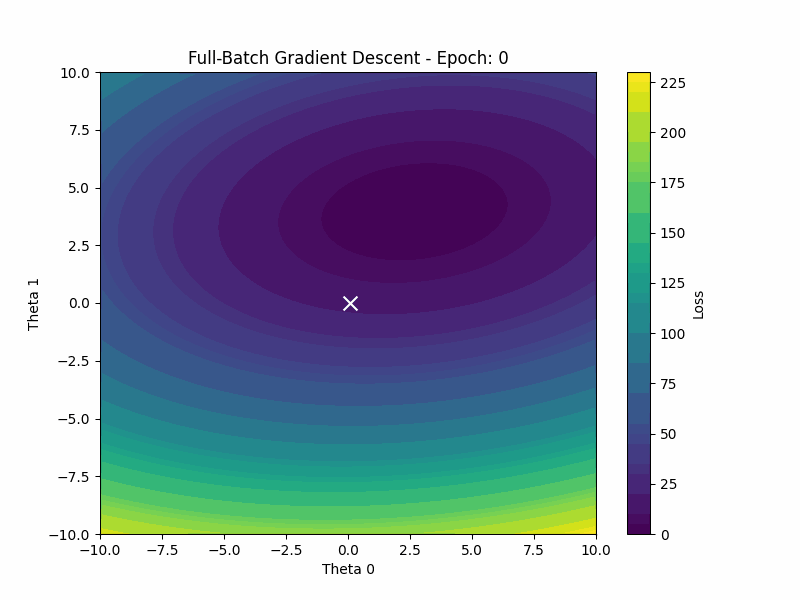

In [ ]:
from IPython.display import Image

# Display the gif file
Image(filename='/content/full_batch_optimization.gif')

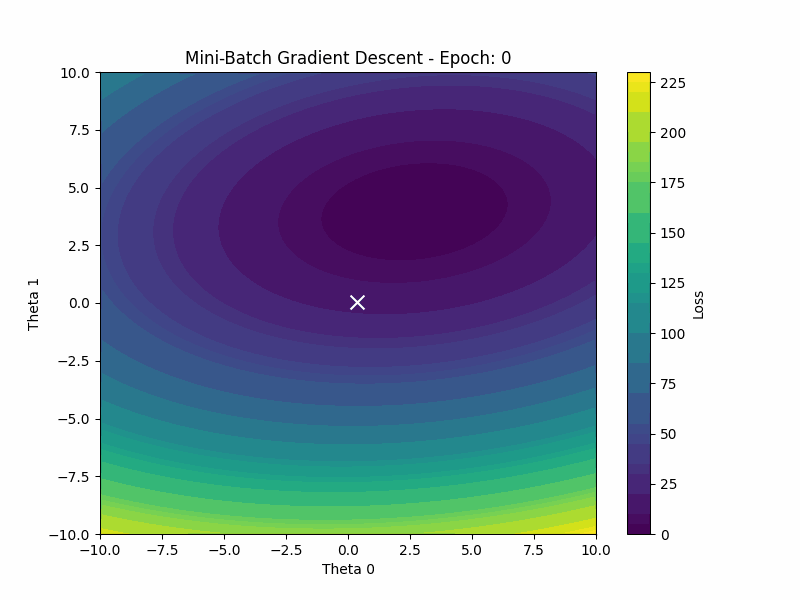

In [ ]:
Image(filename='/content/mini_batch_optimization.gif')

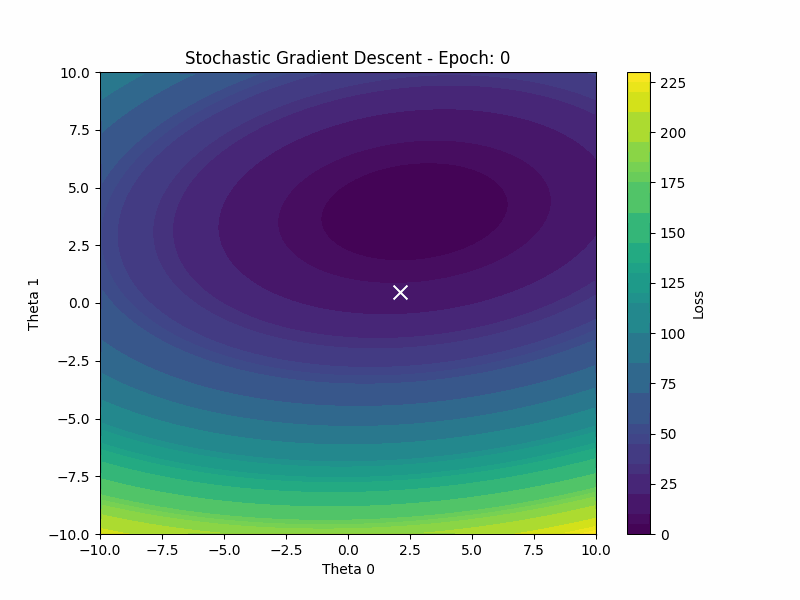

In [ ]:
Image(filename='/content/stochastic_optimization.gif')

- Full-Batch Gradient Descent takes longer to converge because it computes the gradient over the entire dataset, leading to slow but stable updates.
- Stochastic Gradient Descent converges faster due to frequent updates after each sample, but with more noise.
- Mini-Batch Gradient Descent balances between the two, offering faster updates than full-batch with less noise than stochastic, leading to quicker convergence.

1.4

Full-Batch GD with Momentum converged in an average of 50.00 epochs.
Stochastic GD with Momentum converged in an average of 15.27 epochs.

Full-Batch GD without Momentum converged in an average of 302.10 epochs.
Stochastic GD without Momentum converged in an average of 15.90 epochs.



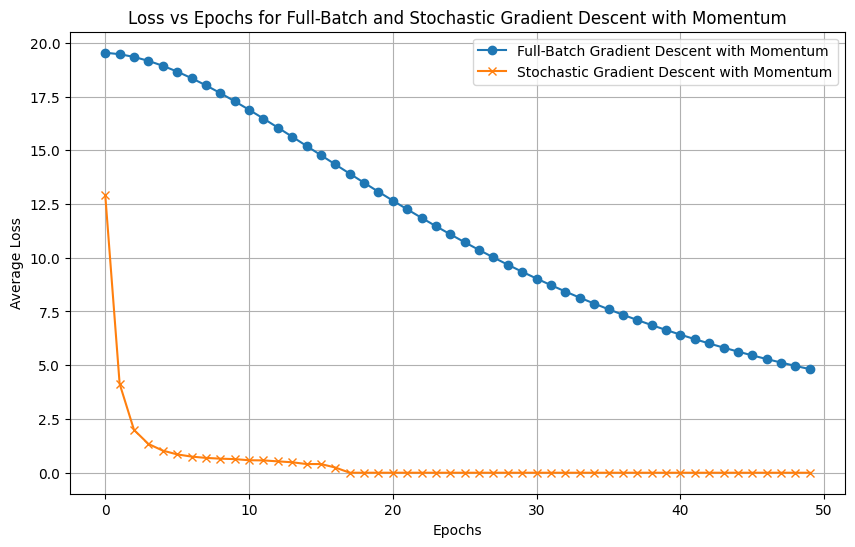

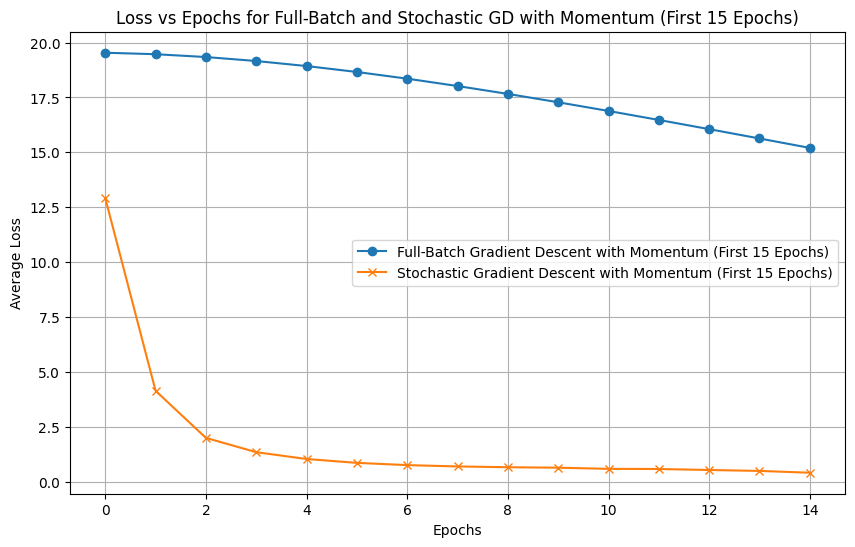

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Step 1: Data Preparation
np.random.seed(45)
num_samples = 40

# Generate data
x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3 * x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps

# Convert to torch tensors
x1_tensor = torch.tensor(x1, dtype=torch.float32).view(-1, 1)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# Step 2: Gradient Descent with Momentum (SGD and Full-batch)
def gradient_descent_with_momentum(x, y, lr, max_epochs, epsilon, beta, method='full-batch', batch_size=None, initial_theta_0=None, initial_theta_1=None):
    # Initialize theta values randomly if not provided
    theta_0 = torch.tensor(initial_theta_0 if initial_theta_0 is not None else np.random.randn(), requires_grad=True)
    theta_1 = torch.tensor(initial_theta_1 if initial_theta_1 is not None else np.random.randn(), requires_grad=True)

    # Initialize momentum terms
    v_0 = torch.tensor(0.0, requires_grad=False)
    v_1 = torch.tensor(0.0, requires_grad=False)

    losses = []  # Stores loss for each epoch
    trajectory = []  # To store the trajectory of theta values
    momentum_trajectory = []  # To store the trajectory of momentum values
    gradient_trajectory = []  # To store the trajectory of gradients
    iterations = 0

    previous_loss = None

    for epoch in range(max_epochs):
        epoch_loss = 0

        if method == 'full-batch':
            y_pred = theta_0 + theta_1 * x
            loss = ((y_pred - y) ** 2).mean()
            loss.backward()

            # Calculate gradients
            d_theta_0 = theta_0.grad
            d_theta_1 = theta_1.grad

            # Momentum update
            v_0 = beta * v_0 + (1 - beta) * d_theta_0
            v_1 = beta * v_1 + (1 - beta) * d_theta_1

            # Parameter update
            theta_0.data -= lr * v_0
            theta_1.data -= lr * v_1

            # Zero gradients
            theta_0.grad.zero_()
            theta_1.grad.zero_()

            epoch_loss = loss.item()

        elif method == 'stochastic':
            epoch_loss = 0
            for i in range(len(x)):  # Cycle through the entire dataset for an epoch
                # Stochastic Gradient Descent: Select sample one by one
                x_sample = x[i].view(-1, 1)
                y_sample = y[i].view(-1, 1)

                y_pred = theta_0 + theta_1 * x_sample
                loss = ((y_pred - y_sample) ** 2).mean()
                loss.backward()

                # Calculate gradients
                d_theta_0 = theta_0.grad
                d_theta_1 = theta_1.grad

                # Momentum update
                v_0 = beta * v_0 + (1 - beta) * d_theta_0
                v_1 = beta * v_1 + (1 - beta) * d_theta_1

                # Parameter update
                theta_0.data -= lr * v_0
                theta_1.data -= lr * v_1

                # Zero gradients
                theta_0.grad.zero_()
                theta_1.grad.zero_()

                epoch_loss += loss.item()

            epoch_loss /= len(x)  # Average loss for the epoch

        # Record the loss for the epoch
        losses.append(epoch_loss)

        # Record the trajectory for plotting
        trajectory.append((theta_0.item(), theta_1.item()))
        momentum_trajectory.append((v_0.item(), v_1.item()))
        gradient_trajectory.append((d_theta_0.item(), d_theta_1.item()))

        iterations += 1

        # Check for convergence criteria
        if previous_loss is not None and abs(epoch_loss - previous_loss) <= epsilon:
            break

        previous_loss = epoch_loss

    return theta_0, theta_1, losses, iterations, trajectory, momentum_trajectory, gradient_trajectory


# Step 3: Run Multiple Times with Different Initial Theta
def run_multiple_times(x, y, lr, max_epochs, epsilon, beta, method, batch_size=None, runs=15):
    total_epochs = 0
    avg_losses = np.zeros(max_epochs)
    avg_trajectory = []
    avg_momentum_trajectory = []
    avg_gradient_trajectory = []

    for run in range(runs):
        # Random initialization of theta for each run
        initial_theta_0 = np.random.randn()
        initial_theta_1 = np.random.randn()

        theta_0, theta_1, losses, epochs, trajectory, momentum_trajectory, gradient_trajectory = gradient_descent_with_momentum(
            x, y, lr, max_epochs, epsilon, beta, method, batch_size=batch_size,
            initial_theta_0=initial_theta_0, initial_theta_1=initial_theta_1)

        total_epochs += epochs

        for i in range(min(epochs, max_epochs)):  # Ensure not to exceed actual epochs
            avg_losses[i] += losses[i]

        avg_trajectory.append(trajectory)
        avg_momentum_trajectory.append(momentum_trajectory)
        avg_gradient_trajectory.append(gradient_trajectory)

    avg_losses /= runs
    avg_epochs = total_epochs / runs

    return avg_losses, avg_epochs, avg_trajectory, avg_momentum_trajectory, avg_gradient_trajectory


# Step 4: Hyperparameters
learning_rate = 0.01
max_epochs = 50
epsilon = 0.001
beta = 0.9  # Momentum factor


# Step 5: Run the gradient descent 15 times and compute averages
avg_losses_full_batch, avg_epochs_full_batch, avg_trajectory_full_batch, avg_momentum_full_batch, avg_gradient_full_batch = run_multiple_times(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, beta, method='full-batch')

avg_losses_stochastic, avg_epochs_stochastic, avg_trajectory_stochastic, avg_momentum_stochastic, avg_gradient_stochastic = run_multiple_times(
    x1_tensor, y_tensor, learning_rate, max_epochs, epsilon, beta, method='stochastic')

# Print average epochs
print(f"Full-Batch GD with Momentum converged in an average of {avg_epochs_full_batch:.2f} epochs.")
print(f"Stochastic GD with Momentum converged in an average of {avg_epochs_stochastic:.2f} epochs.\n")

print(f"Full-Batch GD without Momentum converged in an average of {avg_iterations_full:.2f} epochs.")
print(f"Stochastic GD without Momentum converged in an average of {avg_iterations_stochastic:.2f} epochs.\n")


# Step 6: Plotting the Loss vs Epochs for both methods
plt.figure(figsize=(10, 6))
plt.plot(avg_losses_full_batch, label='Full-Batch Gradient Descent with Momentum', marker='o')
plt.plot(avg_losses_stochastic, label='Stochastic Gradient Descent with Momentum', marker='x')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.title('Loss vs Epochs for Full-Batch and Stochastic Gradient Descent with Momentum')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(avg_losses_full_batch[:15], label='Full-Batch Gradient Descent with Momentum (First 15 Epochs)', marker='o')
plt.plot(avg_losses_stochastic[:15], label='Stochastic Gradient Descent with Momentum (First 15 Epochs)', marker='x')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.title('Loss vs Epochs for Full-Batch and Stochastic GD with Momentum (First 15 Epochs)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
#To get animation and contour

import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Function to compute loss
def compute_loss(theta_0, theta_1, x, y):
    y_pred = theta_0 + theta_1 * x
    loss = ((y_pred - y) ** 2).mean()
    return loss

# Generalized plotting function for full-batch and stochastic gradient descent
def create_gradient_descent_animation(x, y, trajectory_data, momentum_data, gradient_data, title, filename, fps=1):
    fig, ax = plt.subplots(figsize=(8, 6))

    def plot_contour_with_trajectory_and_vectors(ax, x, y, trajectory, momentum_trajectory, gradient_trajectory, title, epoch):
        theta_0_vals = np.linspace(-10, 10, 100)
        theta_1_vals = np.linspace(-10, 10, 100)
        loss_vals = np.zeros((len(theta_0_vals), len(theta_1_vals)))

        for i in range(len(theta_0_vals)):
            for j in range(len(theta_1_vals)):
                theta_0 = torch.tensor(theta_0_vals[i], requires_grad=False)
                theta_1 = torch.tensor(theta_1_vals[j], requires_grad=False)
                loss_vals[i, j] = compute_loss(theta_0, theta_1, x, y).item()

        # Clear previous plot
        ax.clear()

        # Plotting Contours
        contour = ax.contourf(theta_0_vals, theta_1_vals, loss_vals, levels=50, cmap='viridis')
        ax.set_title(f'{title} - Epoch: {epoch}')
        ax.set_xlabel('Theta 0')
        ax.set_ylabel('Theta 1')

        # Add color bar
        if epoch == 1:  # Add color bar only once
            plt.colorbar(contour, ax=ax)

        # Plot trajectory
        trajectory = np.array(trajectory)
        momentum_trajectory = np.array(momentum_trajectory)
        gradient_trajectory = np.array(gradient_trajectory)

        ax.plot(trajectory[:, 0], trajectory[:, 1], marker='o', color='red', linestyle='-', linewidth=2, markersize=4)
        ax.scatter(trajectory[-1, 0], trajectory[-1, 1], marker='x', color='white', s=100)  # Final point

        # Plot gradient and momentum vectors
        for i in range(len(trajectory)):
            ax.arrow(trajectory[i, 0], trajectory[i, 1], gradient_trajectory[i, 0], gradient_trajectory[i, 1],
                     color='blue', head_width=0.2, head_length=0.2, label='Gradient' if i == 0 else "")
            ax.arrow(trajectory[i, 0], trajectory[i, 1], momentum_trajectory[i, 0], momentum_trajectory[i, 1],
                     color='yellow', head_width=0.2, head_length=0.2, label='Momentum' if i == 0 else "")

        ax.legend()

    def update(frame):
        epoch = frame + 1
        plot_contour_with_trajectory_and_vectors(ax, x, y, trajectory_data[:epoch],
                                                 momentum_data[:epoch], gradient_data[:epoch],
                                                 title, epoch)

    ani = animation.FuncAnimation(fig, update, frames=len(trajectory_data), repeat=False)

    # Save the animation as a GIF
    ani.save(filename, writer='pillow', fps=fps)
    plt.close()

# Now, you can call this function for full-batch and stochastic gradient descent

# Example call for full-batch gradient descent
create_gradient_descent_animation(x1_tensor, y_tensor, avg_trajectory_full_batch[0],avg_momentum_full_batch[0], avg_gradient_full_batch[0],"Gradient Descent with Momentum Contour (Full-Batch)","momentum_gradient_descent_full_batch.gif", fps=1)

# Example call for stochastic gradient descent (replace with corresponding lists)
create_gradient_descent_animation(x1_tensor, y_tensor, avg_trajectory_stochastic[0],avg_momentum_stochastic[0], avg_gradient_stochastic[0],"Gradient Descent with Momentum Contour (Stochastic)","momentum_gradient_descent_stochastic.gif", fps=1)

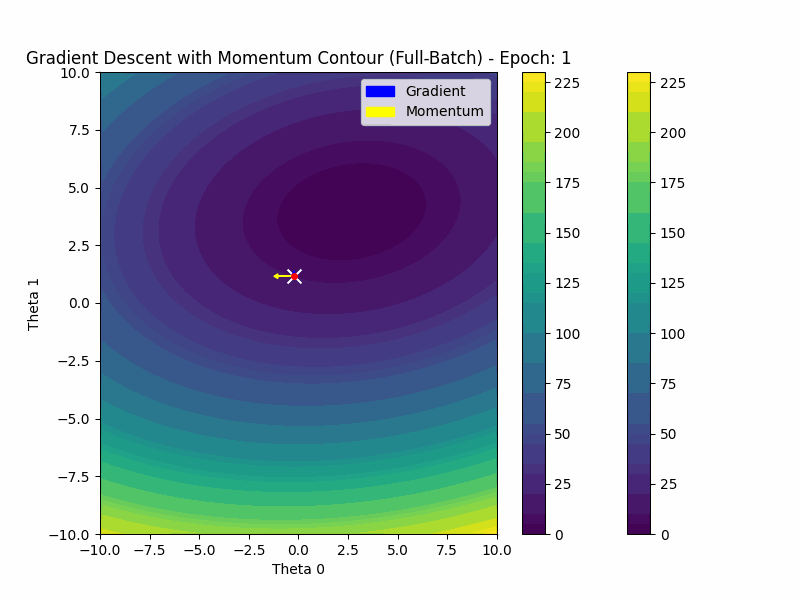

In [ ]:
Image(filename='/content/momentum_gradient_descent_full_batch.gif')

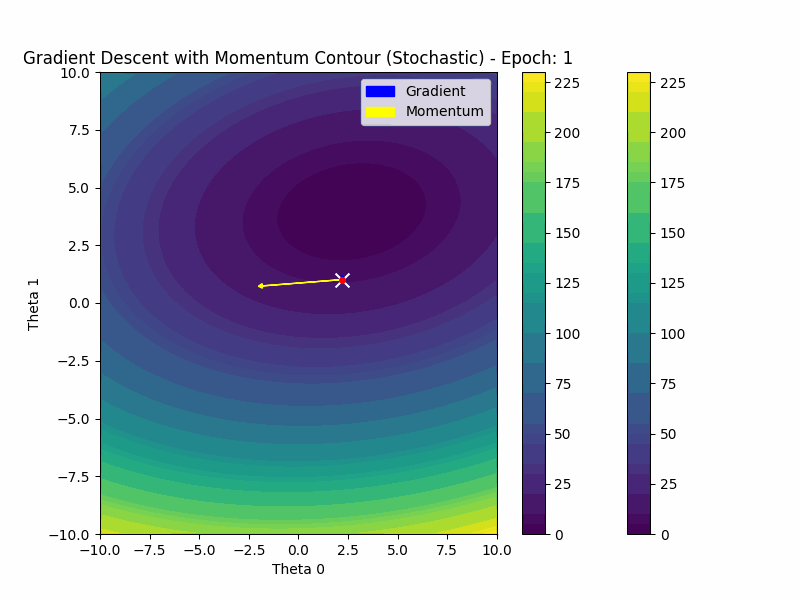

In [ ]:
Image(filename='/content/momentum_gradient_descent_stochastic.gif')



### Explanation

The appearance of the momentum running in an "opposite" direction can be explained by the following:

1. **Accumulated Effect of Previous Gradients**: The momentum term represents a moving average of past gradients. When the optimizer changes directions due to the current gradient, the accumulated momentum may temporarily appear to oppose the gradient. This is a transient effect that occurs when the optimizer is "correcting" its path.

2. **Momentum Overshooting**: If the gradient descent with momentum overshoots a minimum (or is near a curve in the loss surface), the current gradient direction might differ significantly from the accumulated momentum. The momentum continues in its previously accumulated direction, which might look like it is running "opposite" to the new gradient.

3. **Damping Effect**: Over time, the momentum vector will adjust to the new gradient direction. The momentum vector acts like a "smoother" that eventually aligns with the gradient's average direction. The momentary opposition seen in your plot is part of the adjustment process.

In the contour plot:

- The **blue arrow** represents the gradient at each point.
- The **yellow arrow** shows the direction of the momentum.

Around epoch 9 in the plot provided, the optimizer is likely adjusting its trajectory. This is why it temporarily looks like the momentum is moving against the gradient.

## Task 2 : Reconstructing using Random Fourier Features (RFF) [3 marks]

Begin by exploring the [instructor's notebook](https://github.com/nipunbatra/ml-teaching/blob/master/notebooks/siren.ipynb) that introduces the application of Random Fourier Features (RFF) for image reconstruction.

1. **Image Reconstruction** - Choose any image you like. Use Random Fourier Features (RFF) and Linear Regression to learn the mapping from the image coordinates $(X, Y)$ to the pixel colors $(R, G, B)$. Here, $(X, Y)$ represents the coordinates of the pixels, and $(R, G, B)$ represents the color values at those coordinates. Display both the original image and the reconstructed image. Also, calculate and report the Root Mean Squared Error (MSE) and Peak Signal-to-Noise Ratio (PSNR) between the original and reconstructed images. **[1.5 Mark]**

2. **Audio Reconstruction** - Pick a 5-second audio sample of your liking. Use Random Fourier Features (RFF) and Linear Regression to learn the mapping from time $(t)$ to amplitude $(A)$, where $t$ is the time point, and $A$ is the audio amplitude at that time. Play the reconstructed audio and the original audio to demonstrate reconstruction. Calculate the Root Mean Squared Error (RMSE) and Signal-to-Noise Ratio (SNR) to evaluate the reconstruction. **[1.5 Mark]**

Note : Please notice that generally PSNR is used for images while SNR is used for audio signals.

## 2.1 Image reconstruction

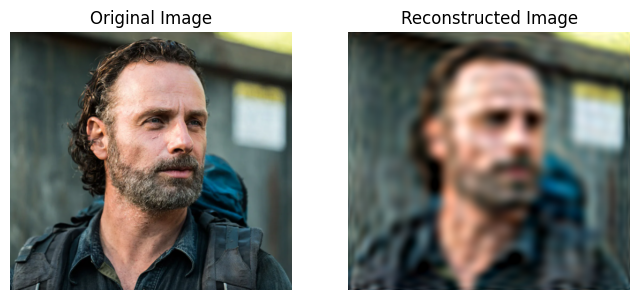

RMSE: 0.06225798847981603
PSNR: 24.11609830468864 dB


In [ ]:
import numpy as np
import torch
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
from torchvision import transforms
from PIL import Image

# Load image and preprocess
image1 = Image.open('/content/pic_1.png').convert('RGB')         # choke-hold is illegal man!
#image = image1.resize((64, 64))  # Resize for simplicity
image_np = np.array(image1) / 255.0

# Generate (X, Y) coordinates and (R, G, B) values
h, w, c = image_np.shape
X, Y = np.meshgrid(np.linspace(-1, 1, w), np.linspace(-1, 1, h))
coords = np.vstack([X.ravel(), Y.ravel()]).T
colors = image_np.reshape(-1, 3)

# Random Fourier Features
def rff_mapping(X, D=256, gamma=10):
    W = np.random.normal(0, gamma, size=(X.shape[1], D))
    b = np.random.uniform(0, 2 * np.pi, size=(D,))
    return np.cos(np.dot(X, W) + b)

# Transform coordinates using RFF
D = 10000  # Number of random features
coords_rff = rff_mapping(coords, D)

# Train Linear Regression
model_r = LinearRegression().fit(coords_rff, colors[:, 0])
model_g = LinearRegression().fit(coords_rff, colors[:, 1])
model_b = LinearRegression().fit(coords_rff, colors[:, 2])

# Reconstruct image using the learned model
reconstructed_r = model_r.predict(coords_rff)
reconstructed_g = model_g.predict(coords_rff)
reconstructed_b = model_b.predict(coords_rff)
reconstructed_image = np.stack([reconstructed_r, reconstructed_g, reconstructed_b], axis=-1).reshape(h, w, c)

# Clamp values to [0, 1]
reconstructed_image = np.clip(reconstructed_image, 0, 1)

# Calculate RMSE and PSNR
rmse_value = np.sqrt(mse(image_np, reconstructed_image))
psnr_value = psnr(image_np, reconstructed_image)

# Display images
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image1)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Reconstructed Image')
plt.imshow(reconstructed_image)
plt.axis('off')
plt.show()

# Print metrics
print(f'RMSE: {rmse_value}')
print(f'PSNR: {psnr_value} dB')


## 2.2 Audio Reconstruction

Audio shape: torch.Size([220500]), Sampling rate: 44100


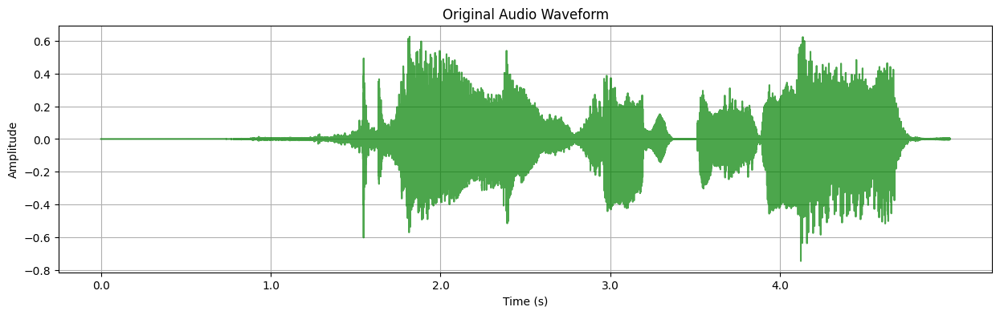

RFF shape: torch.Size([220500, 10000])


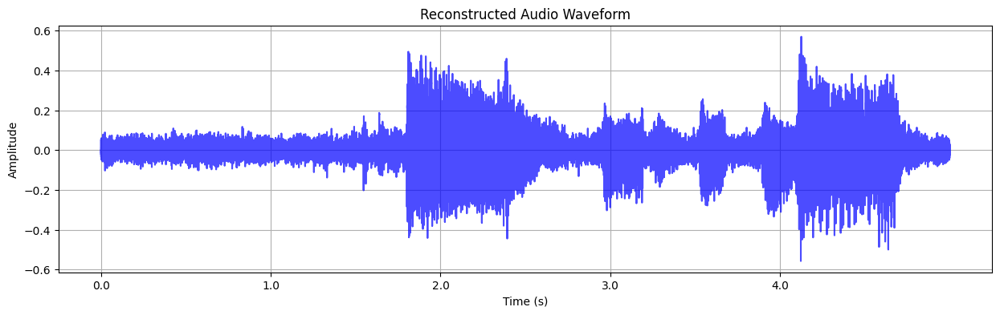

RMSE: 0.0521
SNR: 6.79 dB


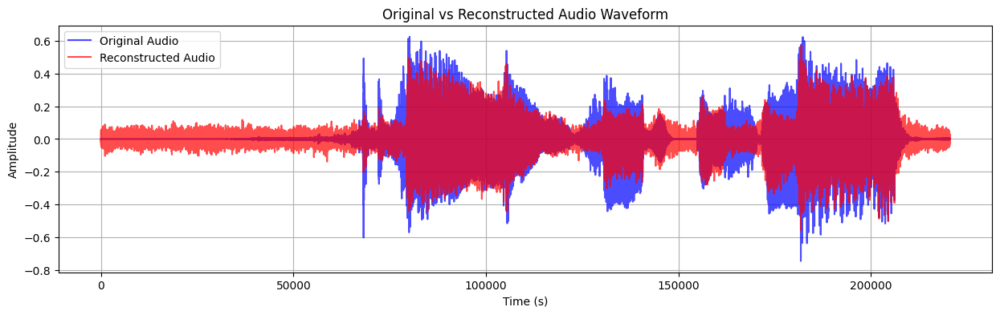

In [ ]:
import numpy as np
import torch
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from IPython.display import Audio
import torchaudio
import soundfile as sf
from sklearn.kernel_approximation import RBFSampler

# Load audio (5-second sample)
audio, sr = torchaudio.load('my_audio.wav')

# Only take the first channel for mono audio
audio = audio[0]

# Normalize audio to [-1, 1]
audio = audio / torch.max(torch.abs(audio))

# Ensure we are working with a 5-second audio sample
audio = audio[:5 * sr]
print(f"Audio shape: {audio.shape}, Sampling rate: {sr}")

# Create time domain shifted to [-100, 100]
X = torch.arange(0, len(audio)).unsqueeze(1).float()
X = X / X.max() * 200 - 100

# Plot the original audio waveform
def audio_plot(audio, sr, color, title):
    plt.figure(figsize=(15, 4))
    plt.plot(audio, color=color, alpha=0.7)
    plt.xticks(np.arange(0, len(audio), sr), np.arange(0, len(audio) / sr, 1))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(title)
    plt.grid()
    plt.show()

audio_plot(audio, sr, 'green', 'Original Audio Waveform')

# Random Fourier Features mapping function
def create_rff_features(X, num_features, sigma):
    rff = RBFSampler(n_components=num_features, gamma=1 / (2 * sigma ** 2), random_state=13)
    X_rff = rff.fit_transform(X.numpy())
    return torch.tensor(X_rff, dtype=torch.float32)

# Generate Random Fourier Features
num_features = 10000
sigma = 0.008
X_rff = create_rff_features(X, num_features, sigma)
print(f"RFF shape: {X_rff.shape}")

# Fit a Linear Model on the Random Fourier Features
model = LinearRegression()
model.fit(X_rff.numpy(), audio.numpy())

# Reconstruct the audio using the model
pred_audio = model.predict(X_rff.numpy())
pred_audio = torch.tensor(pred_audio)

# Save the reconstructed audio
sf.write('pred_audio.wav', pred_audio.numpy(), sr)

# Plot the reconstructed audio waveform
audio_plot(pred_audio, sr, 'blue', 'Reconstructed Audio Waveform')

# Play the original and reconstructed audio
display(Audio(audio.numpy(), rate=sr))
display(Audio(pred_audio.numpy(), rate=sr))

# Compute and display reconstruction metrics (RMSE, SNR)
rmse = np.sqrt(np.mean((audio.numpy() - pred_audio.numpy()) ** 2))
snr = 10 * np.log10(np.mean(audio.numpy() ** 2) / np.mean((audio.numpy() - pred_audio.numpy()) ** 2))

print(f'RMSE: {rmse:.4f}')
print(f'SNR: {snr:.2f} dB')

# Plot comparison between original and reconstructed audio
plt.figure(figsize=(15, 4))
plt.plot(audio.numpy(), color='blue', alpha=0.7, label='Original Audio')
plt.plot(pred_audio.numpy(), color='red', alpha=0.7, label='Reconstructed Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform')
plt.grid()
plt.legend()
plt.show()


## Task 3 : Super-Resolution using Random Fourier Features (RFF)  [4 Marks]

Begin by exploring the [instructor's notebook](https://github.com/nipunbatra/ml-teaching/blob/master/notebooks/siren.ipynb) that introduces the application of Random Fourier Features (RFF) for image reconstruction. Demonstrate the following applications using the cropped image from the notebook:
    
1.  Super-resolution: Perform superresolution on the image shown in notebook to enhance its resolution by factor 2. Show a qualitative comparison of original and reconstructed image. (i.e display original image and the image you created side by side) **[3 Marks]**

2. The above only helps us with a qualitative comparison. Let us now do a quantitative comparison. Compute the below given metrics:  **[1 Marks]**
    - RMSE on predicted v/s ground truth high resolution image
    - Peak SNR on predicted v/s ground truth high resolution image

Follow the below steps to execute this task:
- Start with a 400x400 high-resolution image (the original image).
- Resize it to a 200x200 image (this will be your input image). You can use OpenCV's resize function or another library for this. Here’s a tutorial to help: [OpenCV Resize Image Tutorial](https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/#gsc.tab=0).
- Use Random Fourier Features (RFF) along with linear regression to learn a function based on the 200x200 image.
- Use the learned function to predict the pixel values for the 400x400 image. This means predicting the values for the pixels that fall between the existing pixels of the 200x200 image.
- Compare your predicted 400x400 image with the original 400x400 high-resolution image.
- Calculate the Root Mean Squared Error (RMSE) and Peak Signal-to-Noise Ratio (PSNR) between the predicted image and the original high-resolution image.


--2024-09-20 06:07:10--  https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg
Resolving segment-anything.com (segment-anything.com)... 18.160.143.118, 18.160.143.19, 18.160.143.125, ...
Connecting to segment-anything.com (segment-anything.com)|18.160.143.118|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 221810 (217K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 216.61K  --.-KB/s    in 0.04s   

2024-09-20 06:07:10 (5.25 MB/s) - ‘dog.jpg’ saved [221810/221810]



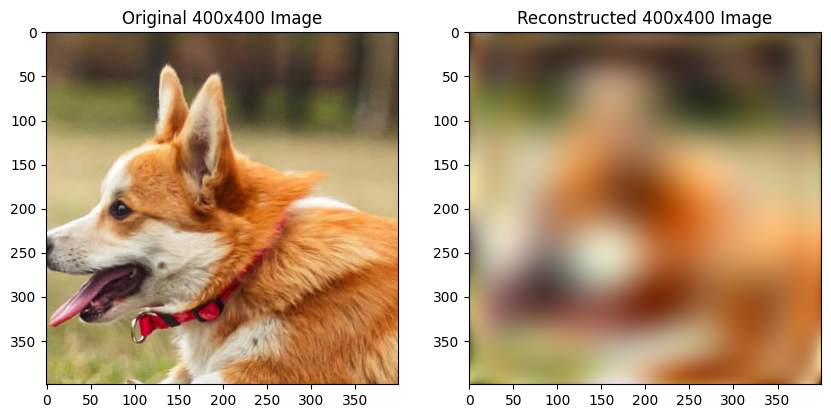

RMSE: 9.229607589166509
PSNR: 28.827138874146662


In [ ]:
import cv2
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import os

# Check for dog image
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

# Load and crop the image to 400x400
original_img = cv2.imread('dog.jpg', cv2.IMREAD_COLOR)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Crop the center of the image to 400x400
h, w, _ = original_img.shape
start_x = w // 2 - 200
start_y = h // 2 - 200
original_img = original_img[start_y:start_y + 400, start_x:start_x + 400]

# Downsample to 200x200
low_res_img = cv2.resize(original_img, (200, 200))

# Function to prepare coordinates for an image
def prepare_coordinates(image_size):
    x = np.linspace(0, 1, image_size)
    y = np.linspace(0, 1, image_size)
    xx, yy = np.meshgrid(x, y)
    coords = np.vstack([xx.ravel(), yy.ravel()]).T
    return coords

# Prepare coordinates for the 200x200 low-res image
low_res_coords = prepare_coordinates(200)

# Generate Random Fourier Features (RFF) for the 200x200 image
D = 3000  # Dimension for RFF
W = np.random.randn(D, 2)  # Random projection matrix
b = 2 * np.pi * np.random.rand(D)  # Bias term

# Function to generate Random Fourier Features (RFF)
def rff_transform(coords, W, b, D):
    return np.sqrt(2 / D) * np.cos(np.dot(coords, W.T) + b)

# Get RFF features for the 200x200 image
features = rff_transform(low_res_coords, W, b, D)

# Flatten the image to match coordinates
low_res_img_flat = low_res_img.reshape(-1, 3)

# Train linear regression for each color channel
predicted_img = np.zeros((400 * 400, 3))
high_res_coords = prepare_coordinates(400)
high_res_features = rff_transform(high_res_coords, W, b, D)

for c in range(3):  # For each color channel (R, G, B)
    model = LinearRegression()
    model.fit(features, low_res_img_flat[:, c])
    predicted_img[:, c] = model.predict(high_res_features)

# Reshape the predicted image back to 400x400x3
predicted_img = predicted_img.reshape(400, 400, 3).astype(np.uint8)

# Show original and predicted images side by side for qualitative comparison
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Original 400x400 Image")
plt.imshow(original_img)

plt.subplot(1, 2, 2)
plt.title("Reconstructed 400x400 Image")
plt.imshow(predicted_img)
plt.show()

# Quantitative comparison: RMSE and PSNR

# Flatten the images to 2D for RMSE calculation
original_img_flat = original_img.reshape(-1, 3)
predicted_img_flat = predicted_img.reshape(-1, 3)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(original_img_flat, predicted_img_flat))
print(f"RMSE: {rmse}")

# Function to calculate PSNR
def calculate_psnr(original, predicted):
    mse = np.mean((original - predicted) ** 2)
    if mse == 0:  # If the images are identical
        return float('inf')
    max_pixel_value = 255.0
    psnr = 20 * np.log10(max_pixel_value / np.sqrt(mse))
    return psnr

# Calculate PSNR
psnr = calculate_psnr(original_img_flat, predicted_img_flat)
print(f"PSNR: {psnr}")

- In images with missing pixels, the matrix is sparse due to the absence of data.
- Many images have repeated patterns or uniform areas, creating implicit redundancy.
- Decomposition compresses the image by capturing essential patterns, reducing dimensionality(sparsity) and efficiently representing the image.

## Task 4 : Image Reconstruction using Matrix Factorisation [4 Marks]

Use the [instructor's notebook](https://github.com/nipunbatra/ml-teaching/blob/master/notebooks/movie-recommendation-knn-mf.ipynb) on matrix factorisation, and solve the following questions. Here, ground truth pixel values are missing for particular regions within the image- you don't have access to them.

1. Pick an image of your liking and reconstruct it using matrix factorization. Choose a suitable value for the rank $r$. Run Gradient Descent until it converges, plot the reconstructed image alongside the original image. Calculate and report the RMSE and PSNR metrics.  **[1 Marks]**

2. Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.**[3 Marks]**

Converged at epoch 20
Converged at epoch 18
Converged at epoch 1
Results for r = 1:
RMSE: 0.2931951643424737
PSNR: 10.656863935508943
Converged at epoch 127
Converged at epoch 226
Converged at epoch 151
Results for r = 2:
RMSE: 0.13578185119160263
PSNR: 17.34316549272622
Converged at epoch 142
Converged at epoch 150
Converged at epoch 279
Results for r = 3:
RMSE: 0.11366147516664521
PSNR: 18.887734234420442
Converged at epoch 443
Converged at epoch 179
Results for r = 4:
RMSE: 0.1007054989401721
PSNR: 19.938936290184813
Converged at epoch 203
Converged at epoch 250
Results for r = 5:
RMSE: 0.09002005518572537
PSNR: 20.913214503167715
Converged at epoch 342
Converged at epoch 320
Converged at epoch 366
Results for r = 6:
RMSE: 0.08139574912909378
PSNR: 21.78796550860021
Converged at epoch 273
Converged at epoch 330
Results for r = 7:
RMSE: 0.07460697801822905
PSNR: 22.54441101808429
Converged at epoch 438
Converged at epoch 326
Converged at epoch 484
Results for r = 8:
RMSE: 0.068547286

Results for r = 24:
RMSE: 0.024788554098203536
PSNR: 32.1149760927074
Optimal r = 24:
Best RMSE: 0.024788554098203536
Best PSNR: 32.1149760927074


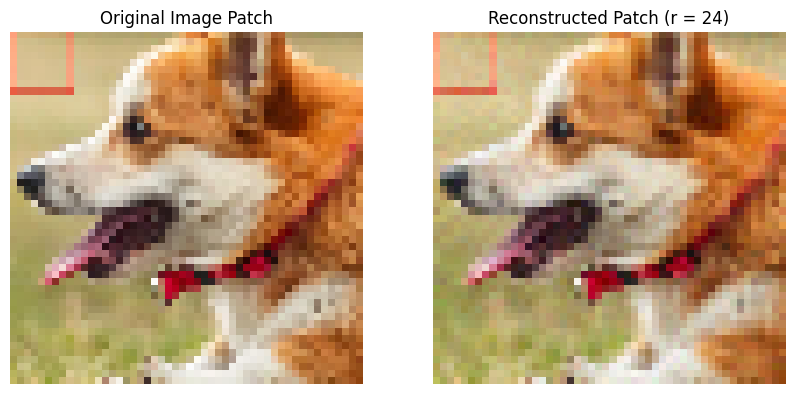

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage import io, img_as_float

# Function to compute the gradient descent updates for each color channel
def gradient_descent(U, V, image_patch, lr=0.01, epochs=500, tol=1e-6):
    N, M = image_patch.shape
    prev_error = float('inf')
    for epoch in range(epochs):
        # Compute the gradient for each color channel
        error = image_patch - np.dot(U, V)
        U_grad = -2 * np.dot(error, V.T)
        V_grad = -2 * np.dot(U.T, error)

        # Update U and V
        U -= lr * U_grad
        V -= lr * V_grad

        #  Compute new RMSE to check convergence
        current_error = np.sqrt(np.mean(error ** 2))
        if abs(prev_error - current_error) < tol:
            print(f"Converged at epoch {epoch}")
            break
        prev_error = current_error

    return U, V

# Function to compress the image patch using matrix factorization for each channel
def compress_image_patch(image_patch, r, lr=0.01, epochs=500):
    N, M, C = image_patch.shape
    # Initialize U and V with random values for each channel
    reconstructed_patch = np.zeros_like(image_patch)
    for c in range(C):
        U = np.random.randn(N, r)*0.01
        V = np.random.randn(r, M)*0.01

        # Apply gradient descent to learn U and V for each channel
        U, V = gradient_descent(U, V, image_patch[:, :, c], lr=lr, epochs=epochs)

        # Reconstruct the image patch for each channel
        reconstructed_patch[:, :, c] = np.dot(U, V)

    return reconstructed_patch

# Function to compute RMSE for each channel
def compute_rmse(original, reconstructed):
    return np.sqrt(np.mean((original - reconstructed) ** 2))

# Function to compute PSNR for each channel
def compute_psnr(original, reconstructed):
    return psnr(original, reconstructed, data_range=original.max() - original.min())

# Function to display the original and reconstructed image patches
def display_images(original, reconstructed, title):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(original)
    axes[0].set_title('Original Image Patch')
    axes[0].axis('off')

    axes[1].imshow(reconstructed)
    axes[1].set_title(title)
    axes[1].axis('off')

    plt.show()

# Load image
image_path = 'patches.jpg'
image = img_as_float(io.imread(image_path))

new_width = 50
new_height = 50
image = cv2.resize(image, (new_width, new_height))

# Check if the image is RGBA
if image.shape[-1] == 4:
    image = image[:, :, :3]  # Discard the alpha channel

# Ensure the image is RGB
if image.shape[-1] != 3:
    raise ValueError("Extracted patch is not RGB. Check the slicing.")



# Define a range of ranks to test
r_values = range(1,25)

best_r = None
best_rmse = float('inf')
best_psnr = float('-inf')
best_reconstructed_image = None

rmse_list = []
psnr_list = []

# Loop through each rank value
for r in r_values:
    # Compress and reconstruct the image patch
    reconstructed_patch = compress_image_patch(image, r)

    # Compute RMSE and PSNR
    rmse_value = compute_rmse(image, reconstructed_patch)
    psnr_value = compute_psnr(image, reconstructed_patch)

    rmse_list.append(rmse_value)
    psnr_list.append(psnr_value)

    # Update the best rank if current RMSE is lower
    if rmse_value < best_rmse:
        best_rmse = rmse_value
        best_psnr = psnr_value
        best_r = r
        best_reconstructed_image = reconstructed_patch

    print(f"Results for r = {r}:")
    print(f"RMSE: {rmse_value}")
    print(f"PSNR: {psnr_value}")

# Display results for the best rank
print(f"Optimal r = {best_r}:")
print(f"Best RMSE: {best_rmse}")
print(f"Best PSNR: {best_psnr}")

# Display original and reconstructed images for the best rank
display_images(image, best_reconstructed_image, f"Reconstructed Patch (r = {best_r})")


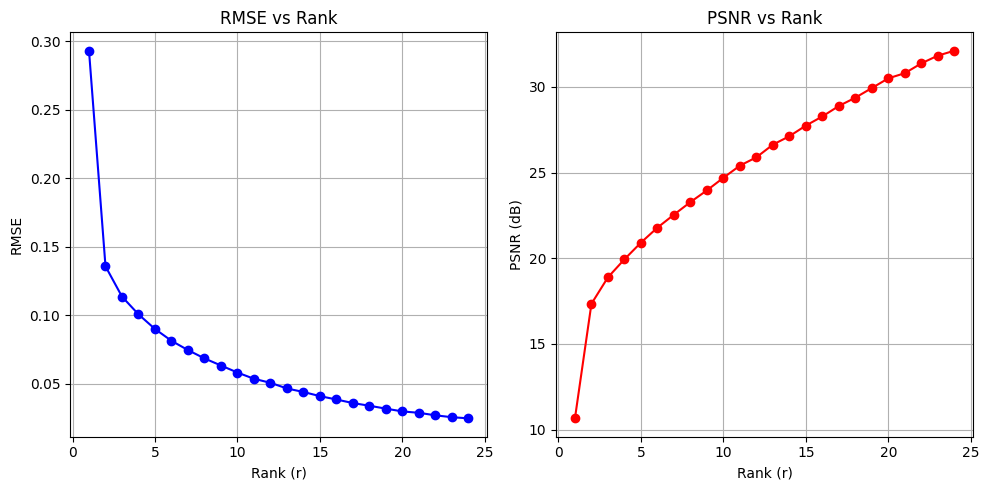

In [ ]:
# Plot RMSE and PSNR vs r
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(r_values, rmse_list, marker='o', color='b', label='RMSE')
plt.xlabel('Rank (r)')
plt.ylabel('RMSE')
plt.title('RMSE vs Rank')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(r_values, psnr_list, marker='o', color='r', label='PSNR')
plt.xlabel('Rank (r)')
plt.ylabel('PSNR (dB)')
plt.title('PSNR vs Rank')
plt.grid(True)

plt.tight_layout()
plt.show()

With SVD Matrix Factorisation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler
from skimage.metrics import peak_signal_noise_ratio as psnr

# Load the image
image_path = 'patches.jpg'
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
height, width, channels = original_img.shape

# Add missing pixels
mask = np.ones((height, width), dtype=bool)
missing_pixels = 900  # 30x30 = 900 missing pixels
missing_coords = np.random.choice(height * width, missing_pixels, replace=False)
mask[np.unravel_index(missing_coords, mask.shape)] = False
masked_img = original_img.copy()
masked_img[~mask] = 0  # Setting the missing pixels to 0

# Matrix Factorization method
def matrix_factorization_reconstruction(masked_img, mask):
    U, S, VT = np.linalg.svd(masked_img.reshape(-1, 3), full_matrices=False)
    S_matrix = np.diag(S)
    reconstructed_img = np.dot(np.dot(U, S_matrix), VT).reshape(masked_img.shape)
    return reconstructed_img

# Reconstruct using matrix factorization
reconstructed_mf_img = matrix_factorization_reconstruction(masked_img, mask)

# Random Fourier Features (RFF) + Linear Regression method
def rff_reconstruction(masked_img, mask, gamma=1e-5, n_components=300):
    coords = np.column_stack(np.nonzero(mask))
    missing_coords = np.column_stack(np.nonzero(~mask))

    # Extract available and missing pixel values
    available_pixels = masked_img[mask]

    rbf_feature = RBFSampler(gamma=gamma, n_components=n_components, random_state=42)
    X_train = rbf_feature.fit_transform(coords)
    X_missing = rbf_feature.transform(missing_coords)

    # Reconstruct for each color channel
    reconstructed_img = masked_img.copy()
    for channel in range(3):
        model = LinearRegression()
        model.fit(X_train, available_pixels[:, channel])
        predicted_pixels = model.predict(X_missing)
        reconstructed_img[~mask, channel] = predicted_pixels

    return reconstructed_img

# Reconstruct using RFF + Linear Regression
reconstructed_rff_img = rff_reconstruction(masked_img, mask)

# RMSE function - modify to handle 3D arrays
def calculate_rmse(original, reconstructed):
    return np.sqrt(mean_squared_error(original.flatten(), reconstructed.flatten()))

# Calculate RMSE for both methods
rmse_mf = calculate_rmse(original_img, reconstructed_mf_img)
rmse_rff = calculate_rmse(original_img, reconstructed_rff_img)

# Calculate PSNR for both methods
psnr_mf = psnr(original_img, reconstructed_mf_img)
psnr_rff = psnr(original_img, reconstructed_rff_img)

# Plot original, masked, and reconstructed images
fig, axs = plt.subplots(2, 2, figsize=(30, 30))
axs[0, 0].imshow(original_img)
axs[0, 0].set_title("Original Image")
axs[0, 1].imshow(masked_img)
axs[0, 1].set_title("Masked Image")
axs[1, 0].imshow(reconstructed_mf_img.astype(np.uint8))
axs[1, 0].set_title(f"Matrix Factorization\nRMSE: {rmse_mf:.2f}, PSNR: {psnr_mf:.2f}")
axs[1, 1].imshow(reconstructed_rff_img.astype(np.uint8))
axs[1, 1].set_title(f"RFF + Linear Regression\nRMSE: {rmse_rff:.2f}, PSNR: {psnr_rff:.2f}")

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler
from skimage.metrics import peak_signal_noise_ratio as psnr

# Load the image
image_path = 'patches.jpg'  # Update the image path as needed
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
height, width, channels = original_img.shape

# Add missing pixels
mask = np.ones((height, width), dtype=bool)
missing_pixels = 900  # 30x30 = 900 missing pixels
missing_coords = np.random.choice(height * width, missing_pixels, replace=False)
mask[np.unravel_index(missing_coords, mask.shape)] = False
masked_img = original_img.copy()
masked_img[~mask] = 0  # Setting the missing pixels to 0

# Matrix Factorization using Gradient Descent
def matrix_factorization_reconstruction(masked_img, mask, r=15, lr=0.001, epochs=1000):
    N, M, C = masked_img.shape
    W = np.random.rand(N * M, r) * 0.01  # Small initial values
    H = np.random.rand(r, C) * 0.01

    for epoch in range(epochs):
        # Compute reconstruction
        reconstruction = W @ H

        # Mask the error only for known pixels
        error = (masked_img.reshape(-1, C) - reconstruction) * mask.reshape(-1, 1)  # Only for known pixels

        # Update W and H
        W += lr * (error @ H.T)
        H += lr * (W.T @ error)

        # Optional: convergence check
        if np.linalg.norm(error) < 1e-6:
            print(f"Converged at epoch {epoch}")
            break

    reconstructed_img = W @ H
    return reconstructed_img.reshape(masked_img.shape)

# Reconstruct using Matrix Factorization
reconstructed_mf_img = matrix_factorization_reconstruction(masked_img, mask)

# Random Fourier Features (RFF) + Linear Regression
def rff_reconstruction(masked_img, mask, gamma=1e-5, n_components=300):
    coords = np.column_stack(np.nonzero(mask))
    missing_coords = np.column_stack(np.nonzero(~mask))

    # Extract available pixel values
    available_pixels = masked_img[mask]

    rbf_feature = RBFSampler(gamma=gamma, n_components=n_components, random_state=42)
    X_train = rbf_feature.fit_transform(coords)
    X_missing = rbf_feature.transform(missing_coords)

    reconstructed_img = masked_img.copy()
    for channel in range(3):
        model = LinearRegression()
        model.fit(X_train, available_pixels[:, channel])
        predicted_pixels = model.predict(X_missing)
        reconstructed_img[~mask, channel] = predicted_pixels

    return reconstructed_img

# Reconstruct using RFF + Linear Regression
reconstructed_rff_img = rff_reconstruction(masked_img, mask)

# RMSE function
def calculate_rmse(original, reconstructed):
    return np.sqrt(np.mean((original.flatten() - reconstructed.flatten()) ** 2))

# Calculate RMSE and PSNR for both methods
rmse_mf = calculate_rmse(original_img, reconstructed_mf_img)
rmse_rff = calculate_rmse(original_img, reconstructed_rff_img)

psnr_mf = psnr(original_img, reconstructed_mf_img)
psnr_rff = psnr(original_img, reconstructed_rff_img)

# Plot original, masked, and reconstructed images
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs[0, 0].imshow(original_img)
axs[0, 0].set_title("Original Image")
axs[0, 1].imshow(masked_img)
axs[0, 1].set_title("Masked Image")
axs[1, 0].imshow(reconstructed_mf_img.astype(np.uint8))
axs[1, 0].set_title(f"Matrix Factorization\nRMSE: {rmse_mf:.2f}, PSNR: {psnr_mf:.2f}")
axs[1, 1].imshow(reconstructed_rff_img.astype(np.uint8))
axs[1, 1].set_title(f"RFF + Linear Regression\nRMSE: {rmse_rff:.2f}, PSNR: {psnr_rff:.2f}")

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

Using Adam

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler
from skimage.metrics import peak_signal_noise_ratio as psnr

# Load the image
image_path = 'patches.jpg'  # Update the image path as needed
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
height, width, channels = original_img.shape

# Add missing pixels
mask = np.ones((height, width), dtype=bool)
missing_pixels = 900  # 30x30 = 900 missing pixels
missing_coords = np.random.choice(height * width, missing_pixels, replace=False)
mask[np.unravel_index(missing_coords, mask.shape)] = False
masked_img = original_img.copy()
masked_img[~mask] = 0  # Setting the missing pixels to 0

# Adam Optimizer for Matrix Factorization
def matrix_factorization_adam(masked_img, mask, r=50, lr=0.001, beta1=0.9, beta2=0.999, epsilon=1e-8, epochs=1000):
    N, M, C = masked_img.shape
    W = np.random.rand(N * M, r) * 0.01  # Small initial values for W
    H = np.random.rand(r, C) * 0.01  # Small initial values for H

    # Initialize moments for Adam
    m_W, v_W = np.zeros_like(W), np.zeros_like(W)
    m_H, v_H = np.zeros_like(H), np.zeros_like(H)

    t = 0  # Time step for Adam

    for epoch in range(epochs):
        t += 1

        # Compute reconstruction
        reconstruction = W @ H

        # Mask the error only for known pixels
        error = (masked_img.reshape(-1, C) - reconstruction) * mask.reshape(-1, 1)  # Only for known pixels

        # Compute gradients
        grad_W = error @ H.T
        grad_H = W.T @ error

        # Update W with Adam
        m_W = beta1 * m_W + (1 - beta1) * grad_W
        v_W = beta2 * v_W + (1 - beta2) * (grad_W ** 2)

        m_W_hat = m_W / (1 - beta1 ** t)
        v_W_hat = v_W / (1 - beta2 ** t)

        W += lr * m_W_hat / (np.sqrt(v_W_hat) + epsilon)

        # Update H with Adam
        m_H = beta1 * m_H + (1 - beta1) * grad_H
        v_H = beta2 * v_H + (1 - beta2) * (grad_H ** 2)

        m_H_hat = m_H / (1 - beta1 ** t)
        v_H_hat = v_H / (1 - beta2 ** t)

        H += lr * m_H_hat / (np.sqrt(v_H_hat) + epsilon)

        # Optional: convergence check
        if np.linalg.norm(error) < 1e-6:
            print(f"Converged at epoch {epoch}")
            break

    reconstructed_img = W @ H
    return reconstructed_img.reshape(masked_img.shape)

# Reconstruct using Matrix Factorization with Adam optimization
reconstructed_mf_adam_img = matrix_factorization_adam(masked_img, mask)

# Random Fourier Features (RFF) + Linear Regression
def rff_reconstruction(masked_img, mask, gamma=1e-5, n_components=300):
    coords = np.column_stack(np.nonzero(mask))
    missing_coords = np.column_stack(np.nonzero(~mask))

    # Extract available pixel values
    available_pixels = masked_img[mask]

    rbf_feature = RBFSampler(gamma=gamma, n_components=n_components, random_state=42)
    X_train = rbf_feature.fit_transform(coords)
    X_missing = rbf_feature.transform(missing_coords)

    reconstructed_img = masked_img.copy()
    for channel in range(3):
        model = LinearRegression()
        model.fit(X_train, available_pixels[:, channel])
        predicted_pixels = model.predict(X_missing)
        reconstructed_img[~mask, channel] = predicted_pixels

    return reconstructed_img

# Reconstruct using RFF + Linear Regression
reconstructed_rff_img = rff_reconstruction(masked_img, mask)

# RMSE function
def calculate_rmse(original, reconstructed):
    return np.sqrt(np.mean((original.flatten() - reconstructed.flatten()) ** 2))

# Calculate RMSE and PSNR for both methods
rmse_mf_adam = calculate_rmse(original_img, reconstructed_mf_adam_img)
rmse_rff = calculate_rmse(original_img, reconstructed_rff_img)

psnr_mf_adam = psnr(original_img, reconstructed_mf_adam_img)
psnr_rff = psnr(original_img, reconstructed_rff_img)

# Plot original, masked, and reconstructed images
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs[0, 0].imshow(original_img)
axs[0, 0].set_title("Original Image")
axs[0, 1].imshow(masked_img)
axs[0, 1].set_title("Masked Image")
axs[1, 0].imshow(reconstructed_mf_adam_img.astype(np.uint8))
axs[1, 0].set_title(f"Matrix Factorization with Adam\nRMSE: {rmse_mf_adam:.2f}, PSNR: {psnr_mf_adam:.2f}")
axs[1, 1].imshow(reconstructed_rff_img.astype(np.uint8))
axs[1, 1].set_title(f"RFF + Linear Regression\nRMSE: {rmse_rff:.2f}, PSNR: {psnr_rff:.2f}")

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

With Proper Initialisation and Using Adam

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler
from skimage.metrics import peak_signal_noise_ratio as psnr

# Load the image
image_path = 'patches.jpg'  # Update the image path as needed
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
height, width, channels = original_img.shape

# Add missing pixels
mask = np.ones((height, width), dtype=bool)
missing_pixels = 900  # 30x30 = 900 missing pixels
missing_coords = np.random.choice(height * width, missing_pixels, replace=False)
mask[np.unravel_index(missing_coords, mask.shape)] = False
masked_img = original_img.copy()
masked_img[~mask] = 0  # Setting the missing pixels to 0

# Xavier Initialization for Matrix Factorization
def xavier_init(shape):
    return np.random.randn(*shape) * np.sqrt(2.0 / sum(shape))

# Adam Optimizer for Matrix Factorization
def matrix_factorization_adam(masked_img, mask, r=20, lr=0.01, beta1=0.9, beta2=0.999, epsilon=1e-8, epochs=3000):
    N, M, C = masked_img.shape
    W = xavier_init((N * M, r))  # Xavier initialization for W
    H = xavier_init((r, C))  # Xavier initialization for H

    # Initialize moments for Adam
    m_W, v_W = np.zeros_like(W), np.zeros_like(W)
    m_H, v_H = np.zeros_like(H), np.zeros_like(H)

    t = 0  # Time step for Adam

    for epoch in range(epochs):
        t += 1

        # Compute reconstruction
        reconstruction = W @ H

        # Mask the error only for known pixels
        error = (masked_img.reshape(-1, C) - reconstruction) * mask.reshape(-1, 1)  # Only for known pixels

        # Compute gradients
        grad_W = error @ H.T
        grad_H = W.T @ error

        # Update W with Adam
        m_W = beta1 * m_W + (1 - beta1) * grad_W
        v_W = beta2 * v_W + (1 - beta2) * (grad_W ** 2)

        m_W_hat = m_W / (1 - beta1 ** t)
        v_W_hat = v_W / (1 - beta2 ** t)

        W += lr * m_W_hat / (np.sqrt(v_W_hat) + epsilon)

        # Update H with Adam
        m_H = beta1 * m_H + (1 - beta1) * grad_H
        v_H = beta2 * v_H + (1 - beta2) * (grad_H ** 2)

        m_H_hat = m_H / (1 - beta1 ** t)
        v_H_hat = v_H / (1 - beta2 ** t)

        H += lr * m_H_hat / (np.sqrt(v_H_hat) + epsilon)

        # Optional: convergence check
        if np.linalg.norm(error) < 1e-6:
            print(f"Converged at epoch {epoch}")
            break

    reconstructed_img = W @ H
    return reconstructed_img.reshape(masked_img.shape)

# Reconstruct using Matrix Factorization with Adam optimization
reconstructed_mf_adam_img = matrix_factorization_adam(masked_img, mask)

# Random Fourier Features (RFF) + Linear Regression
def rff_reconstruction(masked_img, mask, gamma=1e-5, n_components=300):
    coords = np.column_stack(np.nonzero(mask))
    missing_coords = np.column_stack(np.nonzero(~mask))

    # Extract available pixel values
    available_pixels = masked_img[mask]

    rbf_feature = RBFSampler(gamma=gamma, n_components=n_components, random_state=42)
    X_train = rbf_feature.fit_transform(coords)
    X_missing = rbf_feature.transform(missing_coords)

    reconstructed_img = masked_img.copy()
    for channel in range(3):
        model = LinearRegression()
        model.fit(X_train, available_pixels[:, channel])
        predicted_pixels = model.predict(X_missing)
        reconstructed_img[~mask, channel] = predicted_pixels

    return reconstructed_img

# Reconstruct using RFF + Linear Regression
reconstructed_rff_img = rff_reconstruction(masked_img, mask)

# RMSE function
def calculate_rmse(original, reconstructed):
    return np.sqrt(np.mean((original.flatten() - reconstructed.flatten()) ** 2))

# Calculate RMSE and PSNR for both methods
rmse_mf_adam = calculate_rmse(original_img, reconstructed_mf_adam_img)
rmse_rff = calculate_rmse(original_img, reconstructed_rff_img)

psnr_mf_adam = psnr(original_img, reconstructed_mf_adam_img)
psnr_rff = psnr(original_img, reconstructed_rff_img)

# Plot original, masked, and reconstructed images
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs[0, 0].imshow(original_img)
axs[0, 0].set_title("Original Image")
axs[0, 1].imshow(masked_img)
axs[0, 1].set_title("Masked Image")
axs[1, 0].imshow(reconstructed_mf_adam_img.astype(np.uint8))
axs[1, 0].set_title(f"Matrix Factorization with Adam\nRMSE: {rmse_mf_adam:.2f}, PSNR: {psnr_mf_adam:.2f}")
axs[1, 1].imshow(reconstructed_rff_img.astype(np.uint8))
axs[1, 1].set_title(f"RFF + Linear Regression\nRMSE: {rmse_rff:.2f}, PSNR: {psnr_rff:.2f}")

plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

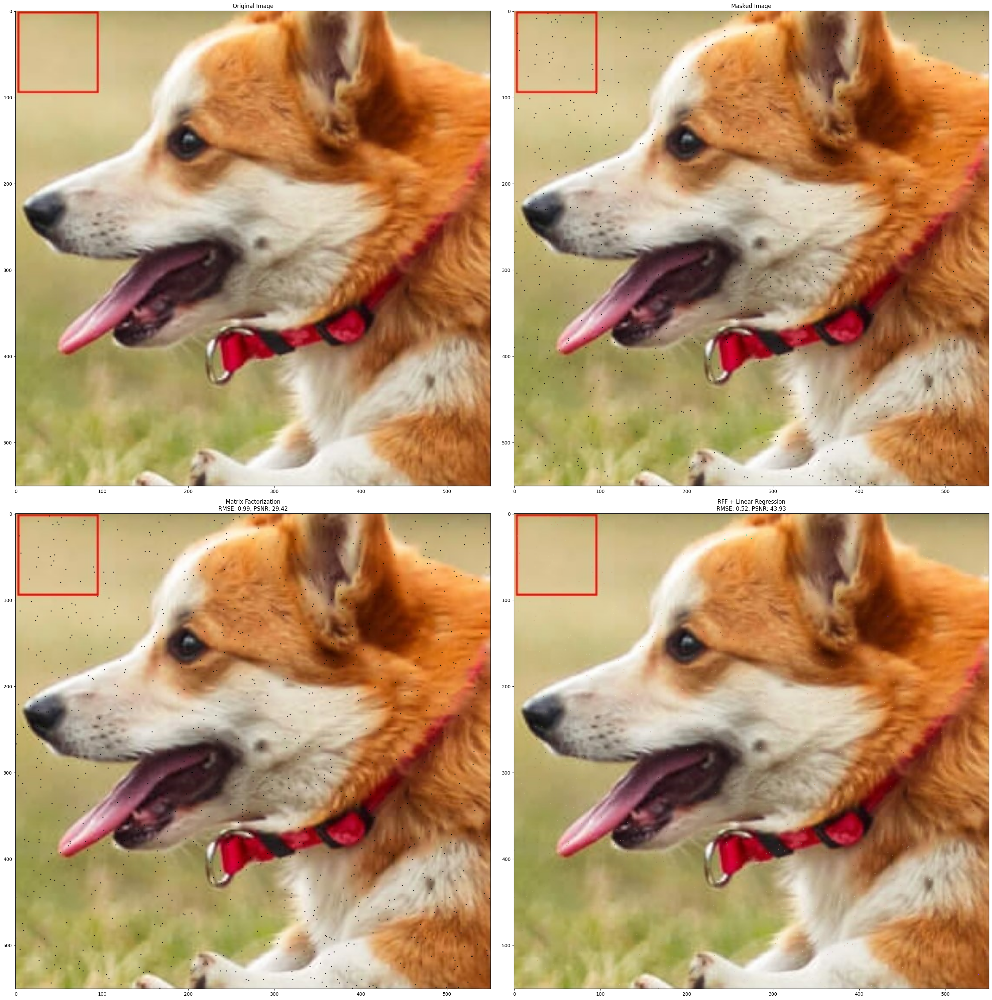

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler
from skimage.metrics import peak_signal_noise_ratio as psnr
import torch
import torch.optim as optim

# Load the image
image_path = 'patches.jpg'
original_img = cv2.imread(image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
height, width, channels = original_img.shape

# Add missing pixels
mask = np.ones((height, width), dtype=bool)
missing_pixels = 900  # 30x30 = 900 missing pixels
missing_coords = np.random.choice(height * width, missing_pixels, replace=False)
mask[np.unravel_index(missing_coords, mask.shape)] = False
masked_img = original_img.copy()
masked_img[~mask] = 0  # Setting the missing pixels to 0

# Factorization function using 2 matrices (W and H)
def factorize(A, k, device=torch.device("cpu"), iterations=1000, lr=0.01):
    """Factorize the matrix A into W and H."""
    A = torch.tensor(A, dtype=torch.float32).to(device)
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)

    optimizer = optim.Adam([W, H], lr=lr)

    for _ in range(iterations):
        loss = torch.norm(torch.mm(W, H) - A)  # Reconstruction loss
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return W, H

# Matrix factorization based reconstruction
def matrix_factorization_reconstruction(masked_img, mask, k=50):
    reconstructed_img = masked_img.copy()

    for channel in range(3):
        available_pixels = masked_img[:, :, channel][mask]
        available_coords = np.column_stack(np.nonzero(mask))

        # Reshape the available pixels into a matrix for factorization
        A = available_pixels.reshape(-1, 1)
        W, H = factorize(A, k)

        # Reconstruct the available pixels only
        reconstructed_channel_flat = torch.mm(W, H).cpu().detach().numpy().flatten()

        # Refill the reconstructed values into the correct positions in the image
        reconstructed_channel = masked_img[:, :, channel].copy()
        reconstructed_channel[mask] = reconstructed_channel_flat

        reconstructed_img[:, :, channel] = reconstructed_channel

    return reconstructed_img

# Reconstruct using matrix factorization
reconstructed_mf_img = matrix_factorization_reconstruction(masked_img, mask)

# Random Fourier Features (RFF) + Linear Regression method
def rff_reconstruction(masked_img, mask, gamma=1e-5, n_components=300):
    coords = np.column_stack(np.nonzero(mask))
    missing_coords = np.column_stack(np.nonzero(~mask))

    # Extract available and missing pixel values
    available_pixels = masked_img[mask]

    rbf_feature = RBFSampler(gamma=gamma, n_components=n_components, random_state=42)
    X_train = rbf_feature.fit_transform(coords)
    X_missing = rbf_feature.transform(missing_coords)

    # Reconstruct for each color channel
    reconstructed_img = masked_img.copy()
    for channel in range(3):
        model = LinearRegression()
        model.fit(X_train, available_pixels[:, channel])
        predicted_pixels = model.predict(X_missing)
        reconstructed_img[~mask, channel] = predicted_pixels

    return reconstructed_img

# Reconstruct using RFF + Linear Regression
reconstructed_rff_img = rff_reconstruction(masked_img, mask)

# RMSE function
def calculate_rmse(original, reconstructed):
    return np.sqrt(mean_squared_error(original.flatten(), reconstructed.flatten()))

# Calculate RMSE for both methods
rmse_mf = calculate_rmse(original_img, reconstructed_mf_img)
rmse_rff = calculate_rmse(original_img, reconstructed_rff_img)

# Calculate PSNR for both methods
psnr_mf = psnr(original_img, reconstructed_mf_img)
psnr_rff = psnr(original_img, reconstructed_rff_img)

# Plot original, masked, and reconstructed images
fig, axs = plt.subplots(2, 2, figsize=(30, 30))
axs[0, 0].imshow(original_img)
axs[0, 0].set_title("Original Image")
axs[0, 1].imshow(masked_img)
axs[0, 1].set_title("Masked Image")
axs[1, 0].imshow(reconstructed_mf_img.astype(np.uint8))
axs[1, 0].set_title(f"Matrix Factorization\nRMSE: {rmse_mf:.2f}, PSNR: {psnr_mf:.2f}")
axs[1, 1].imshow(reconstructed_rff_img.astype(np.uint8))
axs[1, 1].set_title(f"RFF + Linear Regression\nRMSE: {rmse_rff:.2f}, PSNR: {psnr_rff:.2f}")

plt.tight_layout()
plt.show()


## Task 5 : Image Compression using Matrix Factorisation [3 Marks]
    
You have an image patch of size (50x50) that you want to compress using matrix factorization. To do this, you'll split the patch $[N\times N]$ into two smaller matrices of size $[N\times r]$ and $[r\times N]$ using matrix factorization. Compute the compressed patch by multiplying these two matrices and compare the reconstructed image patch with the original patch. Compute the Root Mean Squared Error (RMSE) and Peak Signal-to-Noise Ratio (PSNR) between the original and reconstructed image patches.

- Test different values for the low-rank $r = [5, 10, 25, 50]$.
- Use Gradient Descent to learn the compressed matrices.
- Display the reconstructed image patches, keeping the original pixel values outside the patch unchanged, and use your compressed matrix for the patch to show how well the reconstruction works.
- Compute the RMSE and PSNR for each value of $r$.

Gradient without any Adam optimisation

R value:  5
Step 0, Loss: 1332.6641173773196
Step 100, Loss: 8.958615493396598
Step 200, Loss: 3.2356532281497596
Step 300, Loss: 1.5888490015575965
Step 400, Loss: 0.9179493424036462
Step 500, Loss: 0.592536449926526
Step 600, Loss: 0.4171372833508607
Step 700, Loss: 0.31546522889885037
Step 800, Loss: 0.2531864575378764
Step 900, Loss: 0.21329639398870837
Step 1000, Loss: 0.1867692453912908
Step 1100, Loss: 0.16854962049590708
Step 1200, Loss: 0.1556780021161865
Step 1300, Loss: 0.14635508500215227
Step 1400, Loss: 0.13945012380064656
Step 0, Loss: 1468.3568753029208
Step 100, Loss: 7.844410175107042
Step 200, Loss: 2.7990223059354395
Step 300, Loss: 1.3078582644996675
Step 400, Loss: 0.7036489252217331
Step 500, Loss: 0.41731003063854616
Step 600, Loss: 0.2680763163802637
Step 700, Loss: 0.18492865123500765
Step 800, Loss: 0.13614182234734512
Step 900, Loss: 0.10627802741054897
Step 1000, Loss: 0.08733671004305461
Step 1100, Loss: 0.07495659643705109
Step 1200, Loss: 0.0666557818208

<ipython-input-29-f23a7c736c7b>:27: RuntimeWarning: overflow encountered in square
  loss = np.sum(error ** 2)
<ipython-input-29-f23a7c736c7b>:34: RuntimeWarning: invalid value encountered in subtract
  Q += alpha * (np.dot(error.T, P) - beta * Q)
<ipython-input-29-f23a7c736c7b>:56: RuntimeWarning: invalid value encountered in cast
  reconstructed_channel = np.clip(reconstructed_channel, 0, 255).astype(np.uint8)


Step 300, Loss: nan
Step 400, Loss: nan
Step 500, Loss: nan
Step 600, Loss: nan
Step 700, Loss: nan
Step 800, Loss: nan
Step 900, Loss: nan
Step 1000, Loss: nan
Step 1100, Loss: nan
Step 1200, Loss: nan
Step 1300, Loss: nan
Step 1400, Loss: nan
Step 0, Loss: 368309.43840117654
Step 100, Loss: nan
Step 200, Loss: nan
Step 300, Loss: nan
Step 400, Loss: nan
Step 500, Loss: nan
Step 600, Loss: nan
Step 700, Loss: nan
Step 800, Loss: nan
Step 900, Loss: nan
Step 1000, Loss: nan
Step 1100, Loss: nan
Step 1200, Loss: nan
Step 1300, Loss: nan
Step 1400, Loss: nan


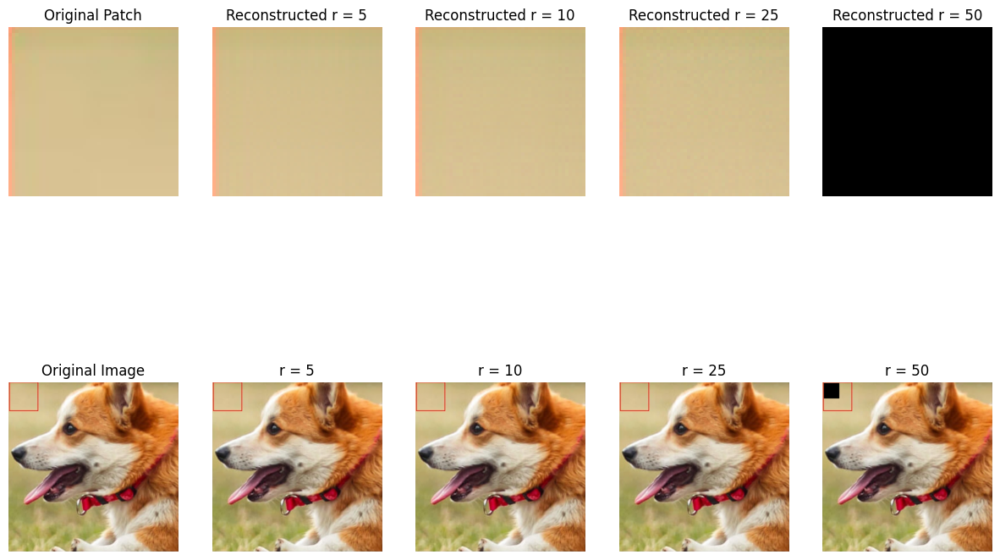

RMSE values:  [1.7150704553069143, 1.69831288832967, 1.7762132004163613, 183.5555933952073]
PSNR values:  [43.44516429635098, 43.53044949998068, 43.1409017423589, 2.8554511471977966]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, mean_squared_error as mse
from PIL import Image

# Load the image and extract the patch
img_path = 'patches.jpg'  # Update with your image path
image = Image.open(img_path)
image_np = np.array(image)

# Define the patch coordinates and size (from the red box in the image)
x, y, patch_size = 5, 5, 50
patch = image_np[y:y + patch_size, x:x + patch_size]

# Normalize patch (for matrix factorization)
patch_norm = patch / 255.0

# Optimized function to perform matrix factorization using gradient descent (vectorized)
def matrix_factorization(R, r, steps=1500, alpha=0.002, beta=0.02, tolerance=1e-4):
    N, M = R.shape
    P = np.random.rand(N, r)
    Q = np.random.rand(M, r)

    for step in range(steps):
        R_pred = np.dot(P, Q.T)
        error = R - R_pred
        loss = np.sum(error ** 2)

        if loss < tolerance:
            break

        # Update P and Q using vectorized operations
        P += alpha * (np.dot(error, Q) - beta * P)
        Q += alpha * (np.dot(error.T, P) - beta * Q)

        if step % 100 == 0:
            print(f"Step {step}, Loss: {loss}")

    return P, Q

# Function to handle matrix factorization for RGB channels
def process_rgb_matrix_factorization(patch_rgb, r_values):
    rmse_values = []
    psnr_values = []
    reconstructed_patches = []

    # Loop over each color channel (R, G, B)
    for r in r_values:
        # Separate the channels
        print("R value: ",r)
        reconstructed_channels = []
        for channel in range(3):
            patch_channel = patch_rgb[:, :, channel] / 255.0  # Normalize
            P, Q = matrix_factorization(patch_channel, r)
            reconstructed_channel = np.dot(P, Q.T) * 255.0  # Reconstruct and denormalize
            reconstructed_channel = np.clip(reconstructed_channel, 0, 255).astype(np.uint8)
            reconstructed_channels.append(reconstructed_channel)

        # Stack the channels back together
        reconstructed_patch = np.stack(reconstructed_channels, axis=2)

        # Ensure the reconstructed patch has the same shape as the original
        reconstructed_patch = np.resize(reconstructed_patch, patch_rgb.shape)
        reconstructed_patches.append(reconstructed_patch)

        # Compute RMSE and PSNR
        rmse = np.sqrt(mse(patch_rgb, reconstructed_patch))
        psnr_value = psnr(patch_rgb, reconstructed_patch, data_range=255)
        rmse_values.append(rmse)
        psnr_values.append(psnr_value)

    return reconstructed_patches, rmse_values, psnr_values

# Function to integrate reconstructed patch back into the original image
def insert_patch_in_image(original_image, reconstructed_patch, x, y):
    reconstructed_image = original_image.copy()
    reconstructed_image[y:y + reconstructed_patch.shape[0], x:x + reconstructed_patch.shape[1]] = reconstructed_patch
    return reconstructed_image

# Reconstruct the patch using different values of r
r_values = [5, 10, 25, 50]
reconstructed_patches, rmse_values, psnr_values = process_rgb_matrix_factorization(patch, r_values)

# Show the original and reconstructed patches for comparison
fig, axes = plt.subplots(2, len(r_values) + 1, figsize=(15, 10))
axes[0, 0].imshow(patch)
axes[0, 0].set_title("Original Patch")
axes[0, 0].axis('off')

# Display original image with unchanged pixel values outside the patch
axes[1, 0].imshow(image_np)
axes[1, 0].set_title("Original Image")
axes[1, 0].axis('off')

for i, r in enumerate(r_values):
    axes[0, i+1].imshow(reconstructed_patches[i])
    axes[0, i+1].set_title(f"Reconstructed r = {r}")
    axes[0, i+1].axis('off')

    # Insert reconstructed patch into the original image
    reconstructed_image_with_patch = insert_patch_in_image(image_np, reconstructed_patches[i], x, y)
    axes[1, i+1].imshow(reconstructed_image_with_patch)
    axes[1, i+1].set_title(f"r = {r}")
    axes[1, i+1].axis('off')

plt.show()

# Display RMSE and PSNR values
print("RMSE values: ", rmse_values)
print("PSNR values: ", psnr_values)


Gradient Descent with Adam Optimisation

R value:  5
Step 0, Loss: 1002.4939344344632
Step 100, Loss: 135.19248653662095
Step 200, Loss: 39.038705120864975
Step 300, Loss: 16.755681786442665
Step 400, Loss: 9.629677361817663
Step 500, Loss: 6.338609564221727
Step 600, Loss: 4.4078241744562
Step 700, Loss: 3.1616020848587008
Step 800, Loss: 2.3219281702630594
Step 900, Loss: 1.740199302217583
Step 1000, Loss: 1.3284810141155305
Step 1100, Loss: 1.032053942997726
Step 1200, Loss: 0.8156110949131475
Step 1300, Loss: 0.6556881532648271
Step 1400, Loss: 0.5363034202752324
Step 1500, Loss: 0.44634763243643116
Step 1600, Loss: 0.37796835666336237
Step 1700, Loss: 0.3255398355906323
Step 1800, Loss: 0.28498820263623026
Step 1900, Loss: 0.2533384744911247
Step 2000, Loss: 0.22840356902506972
Step 2100, Loss: 0.20856655674763125
Step 2200, Loss: 0.19262562004146258
Step 2300, Loss: 0.17968220353014425
Step 2400, Loss: 0.16905959090541672
Step 0, Loss: 1023.5370638740342
Step 100, Loss: 136.22961943830515
Step 200, Loss: 42.493109648002

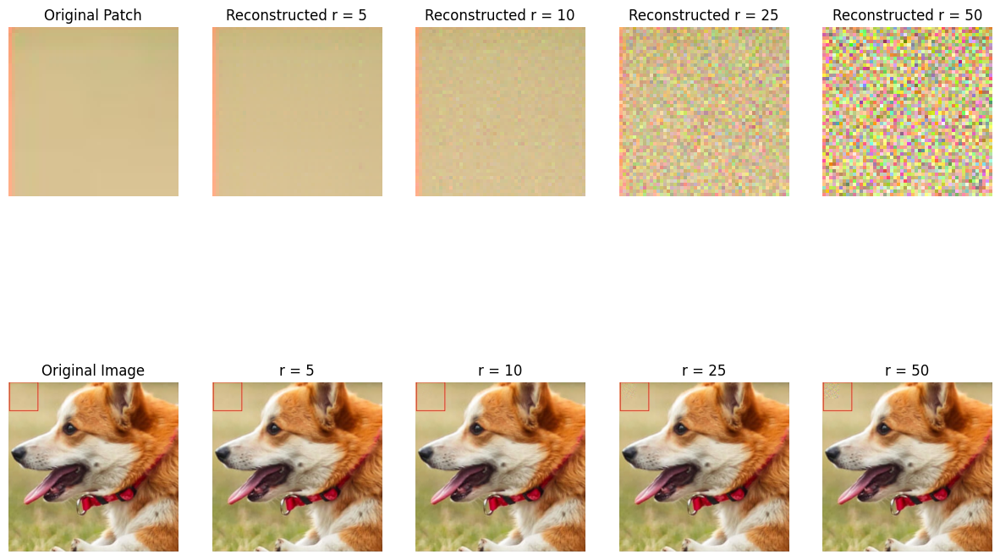

RMSE values:  [1.9369047472707583, 4.54472588098923, 19.52058400765715, 40.888030848485066]
PSNR values:  [42.38863833680455, 34.98064973854883, 22.32094747781478, 15.898879696555202]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, mean_squared_error as mse
from PIL import Image

# Load the image and extract the patch
img_path = 'patches.jpg'  # Update with your image path
image = Image.open(img_path)
image_np = np.array(image)

# Define the patch coordinates and size (from the red box in the image)
x, y, patch_size = 5, 5, 50
patch = image_np[y:y + patch_size, x:x + patch_size]

# Normalize patch (for matrix factorization)
patch_norm = patch / 255.0

# Optimized function to perform matrix factorization using gradient descent (vectorized)
def matrix_factorization(R, r, steps=2500, alpha=0.002, beta=0.02, tolerance=1e-4,
                              beta1=0.9, beta2=0.999, epsilon=1e-8):
    N, M = R.shape
    P = np.random.rand(N, r)
    Q = np.random.rand(M, r)

    # Initialize Adam parameters
    m_P = np.zeros_like(P)
    v_P = np.zeros_like(P)
    m_Q = np.zeros_like(Q)
    v_Q = np.zeros_like(Q)
    t = 0  # Adam iteration counter

    for step in range(steps):
        t += 1
        R_pred = np.dot(P, Q.T)
        error = R - R_pred
        loss = np.sum(error ** 2)

        if loss < tolerance:
            break

        # Gradients
        grad_P = -2 * np.dot(error, Q) + beta * P
        grad_Q = -2 * np.dot(error.T, P) + beta * Q

        # Adam update for P
        m_P = beta1 * m_P + (1 - beta1) * grad_P
        v_P = beta2 * v_P + (1 - beta2) * (grad_P ** 2)
        m_P_hat = m_P / (1 - beta1 ** t)
        v_P_hat = v_P / (1 - beta2 ** t)
        P -= alpha * m_P_hat / (np.sqrt(v_P_hat) + epsilon)

        # Adam update for Q
        m_Q = beta1 * m_Q + (1 - beta1) * grad_Q
        v_Q = beta2 * v_Q + (1 - beta2) * (grad_Q ** 2)
        m_Q_hat = m_Q / (1 - beta1 ** t)
        v_Q_hat = v_Q / (1 - beta2 ** t)
        Q -= alpha * m_Q_hat / (np.sqrt(v_Q_hat) + epsilon)

        if step % 100 == 0:
            print(f"Step {step}, Loss: {loss}")

    return P, Q

# Function to handle matrix factorization for RGB channels
def process_rgb_matrix_factorization(patch_rgb, r_values):
    rmse_values = []
    psnr_values = []
    reconstructed_patches = []

    # Loop over each color channel (R, G, B)
    for r in r_values:
        # Separate the channels
        print("R value: ",r)
        reconstructed_channels = []
        for channel in range(3):
            patch_channel = patch_rgb[:, :, channel] / 255.0  # Normalize
            P, Q = matrix_factorization(patch_channel, r)
            reconstructed_channel = np.dot(P, Q.T) * 255.0  # Reconstruct and denormalize
            reconstructed_channel = np.clip(reconstructed_channel, 0, 255).astype(np.uint8)
            reconstructed_channels.append(reconstructed_channel)

        # Stack the channels back together
        reconstructed_patch = np.stack(reconstructed_channels, axis=2)

        # Ensure the reconstructed patch has the same shape as the original
        reconstructed_patch = np.resize(reconstructed_patch, patch_rgb.shape)
        reconstructed_patches.append(reconstructed_patch)

        # Compute RMSE and PSNR
        rmse = np.sqrt(mse(patch_rgb, reconstructed_patch))
        psnr_value = psnr(patch_rgb, reconstructed_patch, data_range=255)
        rmse_values.append(rmse)
        psnr_values.append(psnr_value)

    return reconstructed_patches, rmse_values, psnr_values

# Function to integrate reconstructed patch back into the original image
def insert_patch_in_image(original_image, reconstructed_patch, x, y):
    reconstructed_image = original_image.copy()
    reconstructed_image[y:y + reconstructed_patch.shape[0], x:x + reconstructed_patch.shape[1]] = reconstructed_patch
    return reconstructed_image

# Reconstruct the patch using different values of r
r_values = [5, 10, 25, 50]
reconstructed_patches, rmse_values, psnr_values = process_rgb_matrix_factorization(patch, r_values)

# Show the original and reconstructed patches for comparison
fig, axes = plt.subplots(2, len(r_values) + 1, figsize=(15, 10))
axes[0, 0].imshow(patch)
axes[0, 0].set_title("Original Patch")
axes[0, 0].axis('off')

# Display original image with unchanged pixel values outside the patch
axes[1, 0].imshow(image_np)
axes[1, 0].set_title("Original Image")
axes[1, 0].axis('off')

for i, r in enumerate(r_values):
    axes[0, i+1].imshow(reconstructed_patches[i])
    axes[0, i+1].set_title(f"Reconstructed r = {r}")
    axes[0, i+1].axis('off')

    # Insert reconstructed patch into the original image
    reconstructed_image_with_patch = insert_patch_in_image(image_np, reconstructed_patches[i], x, y)
    axes[1, i+1].imshow(reconstructed_image_with_patch)
    axes[1, i+1].set_title(f"r = {r}")
    axes[1, i+1].axis('off')

plt.show()

# Display RMSE and PSNR values
print("RMSE values: ", rmse_values)
print("PSNR values: ", psnr_values)
